<a href="https://colab.research.google.com/github/marekpiotradamczyk/ml_uwr/blob/main/Lectures/11-boosting.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Machine Learning @ UWr 2023

**Lecture 11**

During the last lecture we have seen how Decision Trees can be used to learn simple if-else models. A sufficiently deep tree can express any relation between the target and the features. However, nodes in deep trees are fitted to smaller and smaller datasets and the tree building process becomes noisy.

The Random Forest resolved this issue by embracing randomness: several trees were built, and their results averaged. To work well, the forest required that individual trees fit well the data (hence they are often unpruned) and that they are different, which was achieved by injecting randomness into the tree growing process.

In the ideal ensembling scenario, individual classifiers are strong and make mistakes on different examples, making the ensemble more accurate than any tree on its constituents.


# Boosting Weak Classifiers

Today we will consider the case when individual classififers are barely better than chance. We will call them _weak learners_. By itself, their ensemble will most often not work because the simple classifiers will be correlated, and their errors will overlap. Classifier boosting began with a theoretical question:

> Is it possible to combine weak classifiers (only slightly better than random guessing) into a strong classifer (training error rate is arbitrarily low)?

As we will see the answer is positive. The main intuition is that we can't simply inject randomness and hope that weak classifiers will be decorrelated enough to drive the overall error down, like we did in the case of Random Forest. Instead, we will build the ensemble sequentially. Each classifier will be trained to improve on the output of the classifiers added so far. By forcing the classifiers to correct the mistakes performed by the previous ones, we can drive the overall training error low.

As such, boosting is not concerned with overfitting and reducing classifier variance, but with modeling complex decision boundaries when the available learners can only produce simple ones. However, it was found to produce models which generalize well. In fact, boosted Decision Trees are extremely good classifiers, probably the best general-purpose ones.

We will first see how boosting works on a few examples. Then we will prove that it does indeed lower the trainng error. Next, we will look at boosting from a function optimization viewpoint, culminating in XGBoost, a very successful boosting implementation that has won several Kaggle contests.

## AdaBoost Intuitions

The gist of the AdaBoost algorithm implements these steps:
1. Start with an empty ensemble, assign uniform weights to all samples in the dataset.
2. In a loop:
    1. Train a classifier on the weighted data
    2. Add it to the ensemble, possibly with a weight
    3. Score the training dataset with the ensemble, increase the weigths of incorrectly classified examples, decrease the weights of correctly classified ones

The final scoring function is a weighted combination of classifiers built in all rounds:
$$
F(x) = \alpha_1 f_1(x) + \alpha_2 f_2(x) + \alpha_3 f_3(x) + \ldots
$$
For a binary classification problem the final classification rule is 
$$
H(X) = \mathrm{sign}(F(X))
$$

### Examples

In the example below the weak learner is the Desicion Tree Stump (a tree with only one split). 

We train the first weak classifier on all data with uniform weights.

We then increase the weight of misclassified examples and decrease the weight of correctly classified ones. A new classifier is thus trained to pay more attention to the errors of the previous ones.

Notice that the final decision boundary is impossible to express as a single Decision Tree Stump.


In [34]:
import matplotlib.pylab as plt
import numpy as np
import pandas as pd
import seaborn as sns
from sklearn import datasets, linear_model, model_selection, svm, tree

In [35]:
# @title Utility funs


def get_grid(X):
    Grid = np.meshgrid(
        np.linspace(X[:, 0].min() - 0.1, X[:, 0].max() + 0.1, 50),
        np.linspace(X[:, 1].min() - 0.1, X[:, 1].max() + 0.1, 50),
    )
    XGridFlat = np.concatenate(
        (Grid[0].reshape(-1, 1), Grid[1].reshape(-1, 1)), axis=-1
    )
    return Grid, XGridFlat


def plot_data(X, Y, W=None, XGrid=None, YGrid=None):
    pal2 = sns.color_palette("Set1")[:2]
    if XGrid is not None:
        plt.contourf(
            XGrid[0],
            XGrid[1],
            YGrid.reshape(XGrid[0].shape),
            cmap="Set1",
            vmin=-1,
            vmax=9,
            alpha=0.7,
        )
    sns.scatterplot(x=X[:, 0], y=X[:, 1], size=W, hue=Y, palette=pal2)
    plt.axis("square")
    plt.xlim(X[:, 0].min() - 0.1, X[:, 0].max() + 0.1)
    plt.ylim(X[:, 1].min() - 0.1, X[:, 1].max() + 0.1)

    # Remove size from legend
    ax = plt.gca()
    # EXTRACT CURRENT HANDLES AND LABELS
    h, l = ax.get_legend_handles_labels()

    # COLOR LEGEND (FIRST 30 ITEMS)
    col_lgd = plt.legend(h[:2], l[:2], loc="upper right")


def plot_boost_round(t, X, Y, W_old, XGrid, weak_preds, adaboost_preds):
    plt.figure(figsize=(16, 4))
    plt.subplot(1, 2, 1)
    plot_data(X, Y, W_old, XGrid, weak_preds)
    plt.title(f"Weak classifier {t}\n(old sample weights)")

    plt.subplot(1, 2, 2)
    plot_data(X, Y, W_old, XGrid, adaboost_preds)
    plt.title(f"Boosting round {t}\n(updated sample weights)")

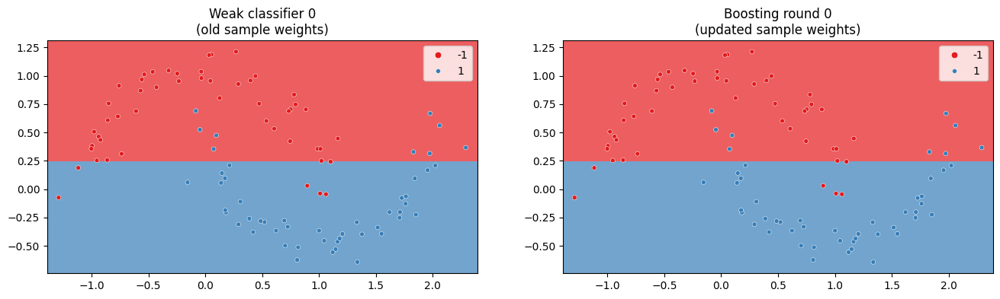

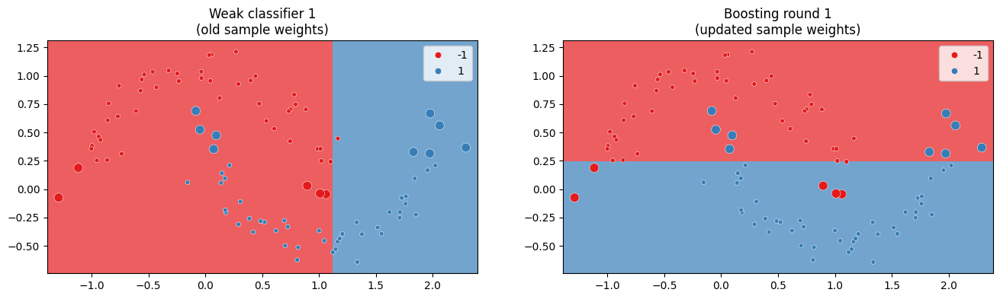

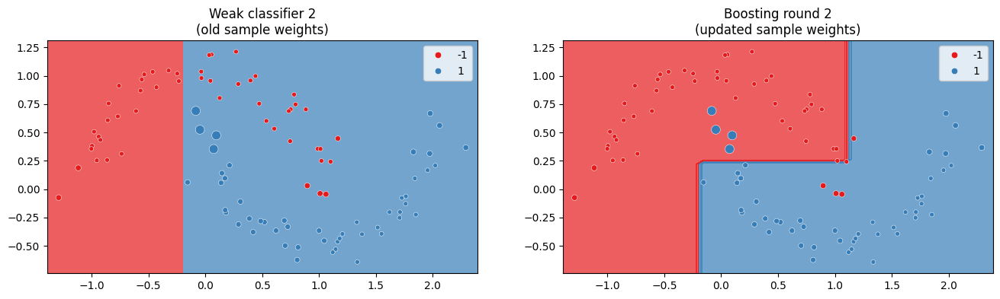

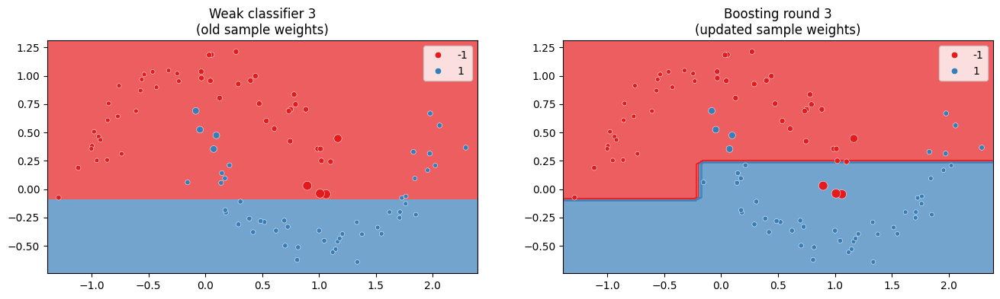

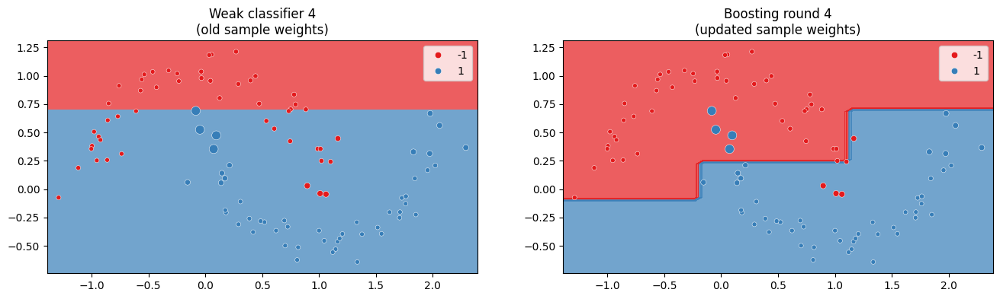

...

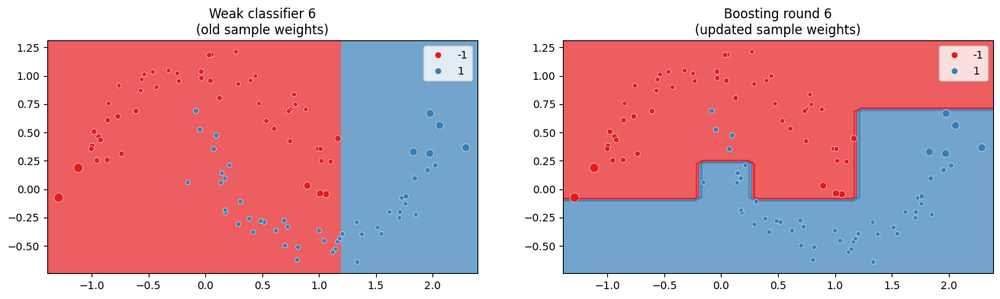

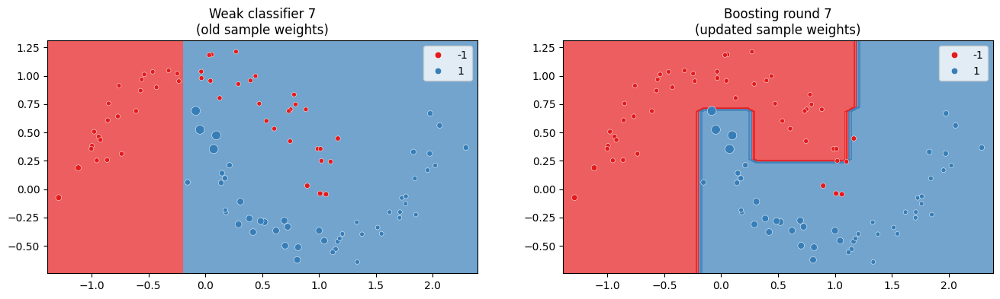

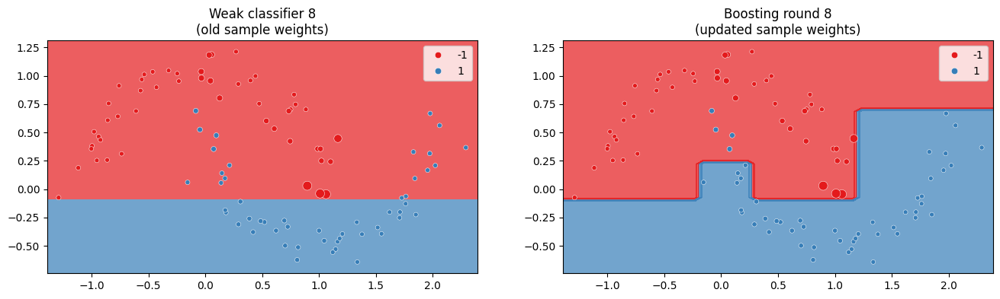

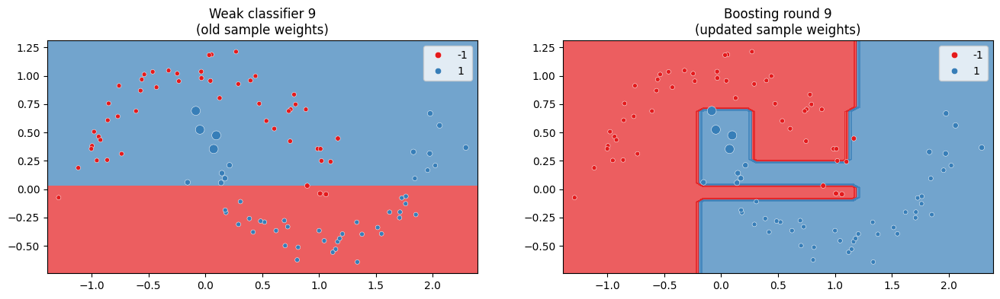

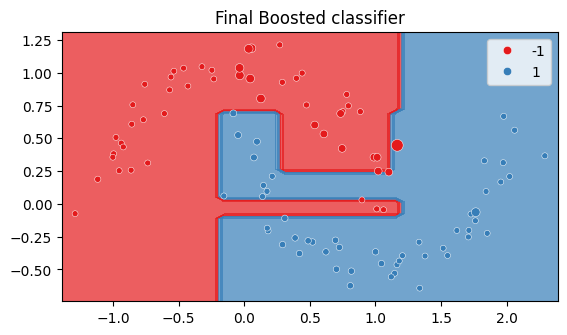

In [36]:
# @title Demo

# Moons data
X, Y = datasets.make_moons(noise=0.1)
Y = Y * 2 - 1  # Make Y +1 or -1

T = 10
W = np.ones(Y.shape)

XGrid, XGridFlat = get_grid(X)
grid_scores = 0
Y_scores = 0

H = []
train_errs = []

for t in range(T):
    f_t = tree.DecisionTreeClassifier(max_depth=1).fit(X, Y, W)
    err_t = ((f_t.predict(X) != Y) * W).mean()
    alpha_t = 0.5 * np.log((1 - err_t) / err_t)
    W_old = W
    W = W_old * np.exp(-alpha_t * Y * f_t.predict(X))

    grid_scores += alpha_t * f_t.predict(XGridFlat)

    plot_boost_round(
        t, X, Y, W_old, XGrid, f_t.predict(XGridFlat), np.sign(grid_scores)
    )

plt.figure()
plot_data(X, Y, W, XGrid, np.sign(grid_scores))
plt.title(f"Final Boosted classifier")
None

In [37]:
W_old.shape

(100,)

## Adaboost Details


Assume that the classes are binary, and encode them as $Y\in\{+1, -1\}$. We will perform $T$ rounds of boosting, building the weak classifier $f_t(X)$ in the $t$-th round and adding it to the ensemble classifier  $F_t(x) = \sum_{t'=1}^{t}\alpha_{t'} f_{t'}(x)$.

The AdaBoost algorithm works as follows:

1. Initialization:
    1. $w_1^i=1$  (assign equal weight to all samples in the dataset)

    2. $F_0(x) = 0$

2. for $t=1,...,T$:
    1. $f_t=$ a weak classifier trained on data weighted by $w_t$
    
    2. $\epsilon_t = \frac{\sum_i w_t^i [f_t(x^i) \neq y^i]}{\sum_i w_t^i}$ ($\epsilon_t$ is the weighted error rate of $f_t$)
    
    3. $\alpha_t = \frac{1}{2}\log\frac{1-\epsilon_t}{\epsilon_t}$ (note that we require that $\epsilon_t < 0.5$  which implies $\alpha_t > 0$).

    4. $F_t(x) = F_{t-1}(x) + \alpha_t f_t(x)$
    
    5. $w_{t+1} = e^{-y^i F_t(x^i)}$ (reweight the data).

       Notice that this changes the weights to concentrate on badly classified samples:
$$
\begin{split}
    w_{t+1} &= e^{-y^i F_t(x^i)} = e^{-y^i \sum_{t'=1}^t \alpha_{t'} f_{t'}(x^i)} = \\
    &= w_t \cdot e^{-y^i\alpha_t t_f(x^i)} \\
    &= w_t \begin{cases}
    e^{-\alpha_t} &\text{ if } y^i = f_t(x^i) \\
    e^{\alpha_t}  &\text{ if } y^i \neq f_t(x^i) 
    \end{cases}
\end{split}
$$

3. Return final classifier $H(x) = \text{sign}(F_t(x))$



We show below the relationship between $\epsilon_t$ and $\alpha_t$. We can observe that perfect classifiers would get an infinitely large weight, while a random classifier would get a weight 0, which would effectively remove it from the ensemble.

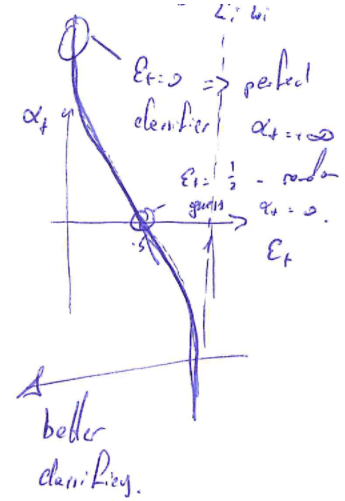

#### Multiplicative Weight Update : 
the way Adaboost updates its weights is an example of a much more general framework: [Multiplicative weight update](https://en.wikipedia.org/wiki/Multiplicative_weight_update_method), which has found many applications across Computer Science. An early example of MWU in action we could have seen in Bayesian classifiers.

### Additional demonstrations

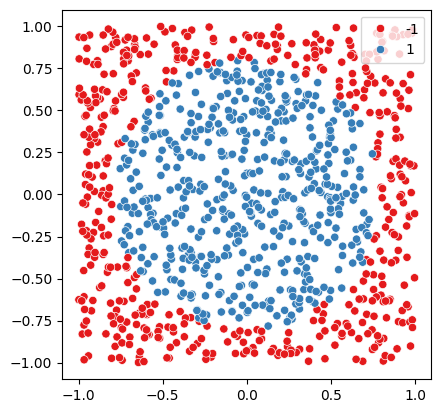

In [38]:
# Generate a nonlinearly separable dataset

# Circle dataset
X = np.random.rand(1000, 2) * 2 - 1
Y = (X ** 2).sum(-1) < (2 / np.pi)
Y = Y * 2 - 1

plot_data(X, Y)

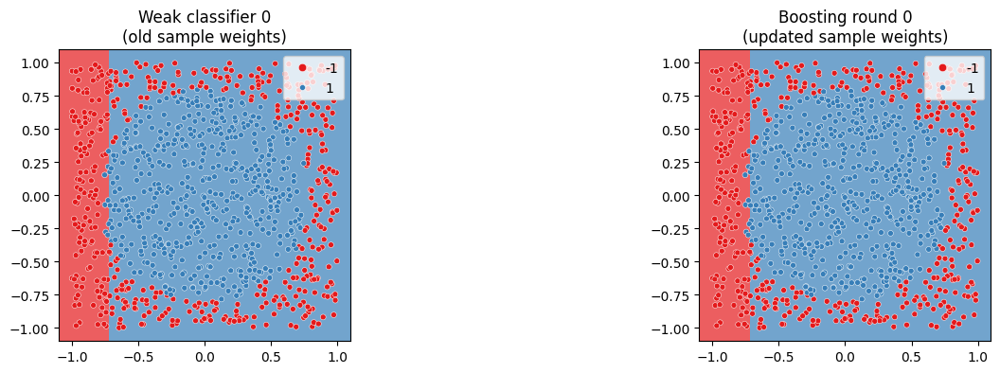

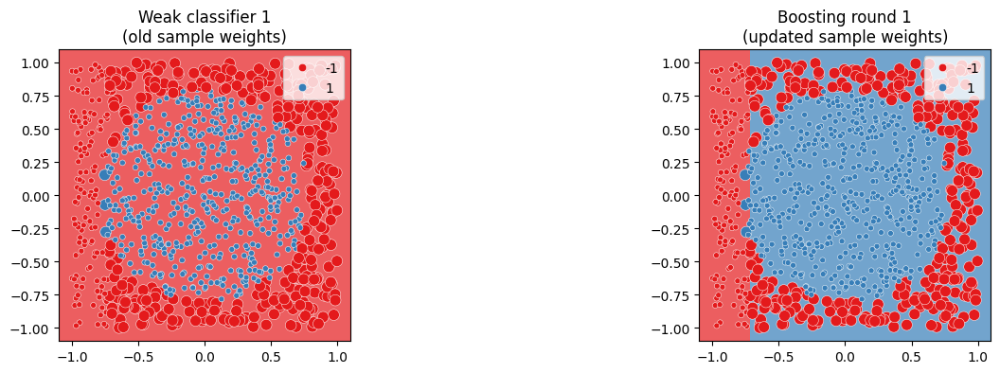

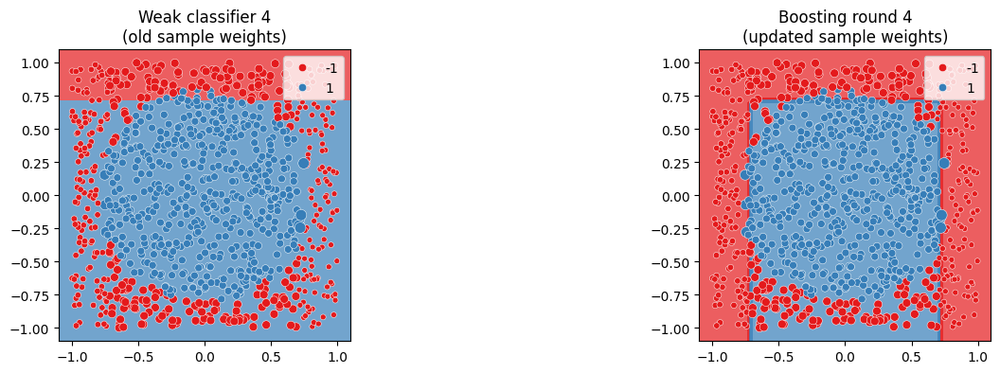

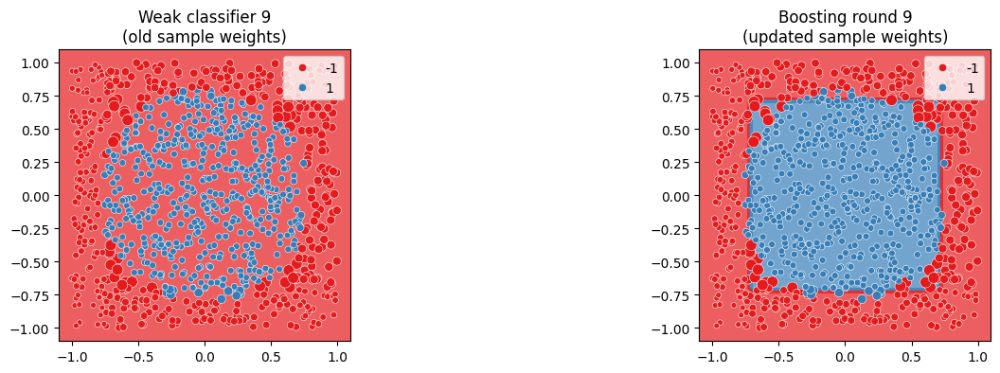

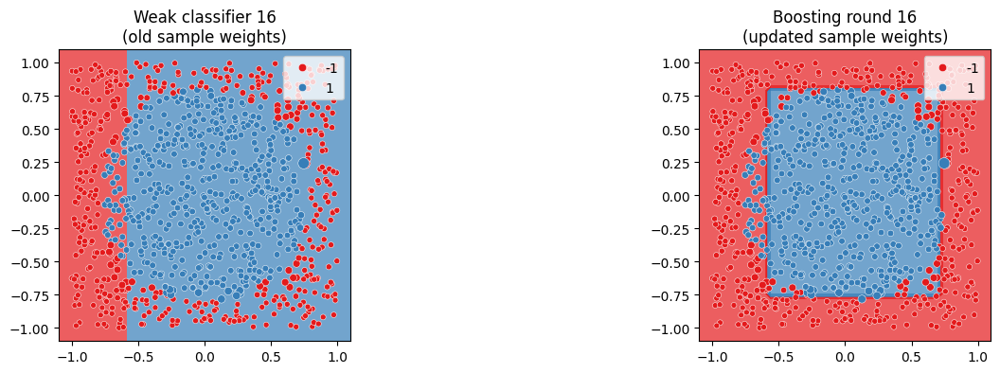

...

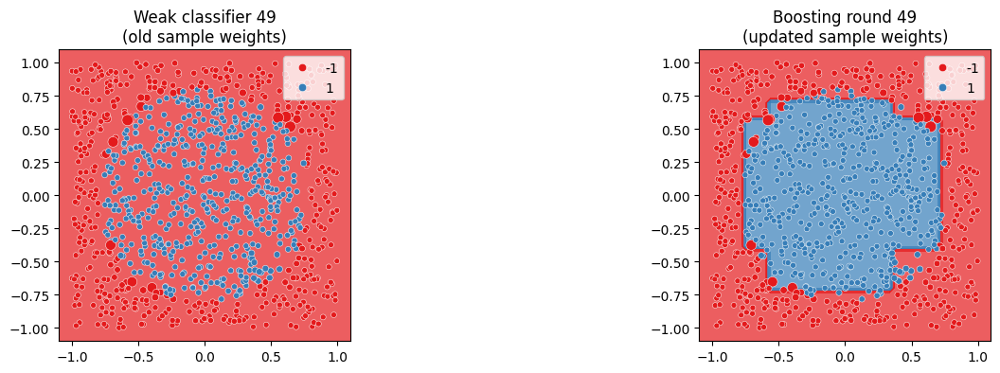

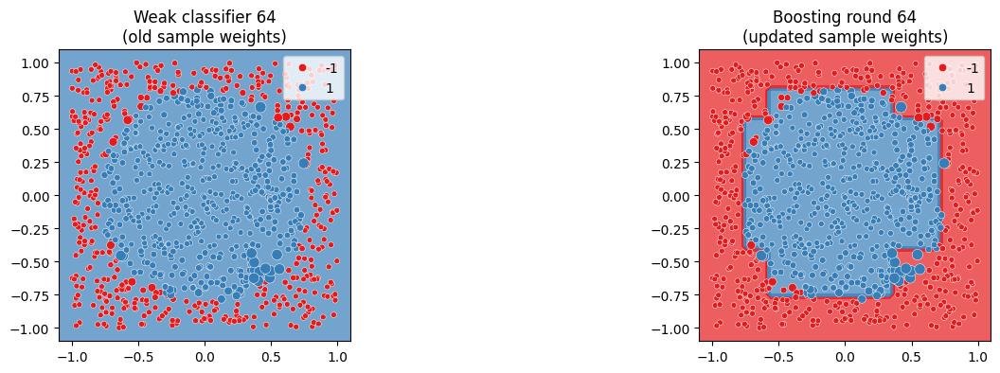

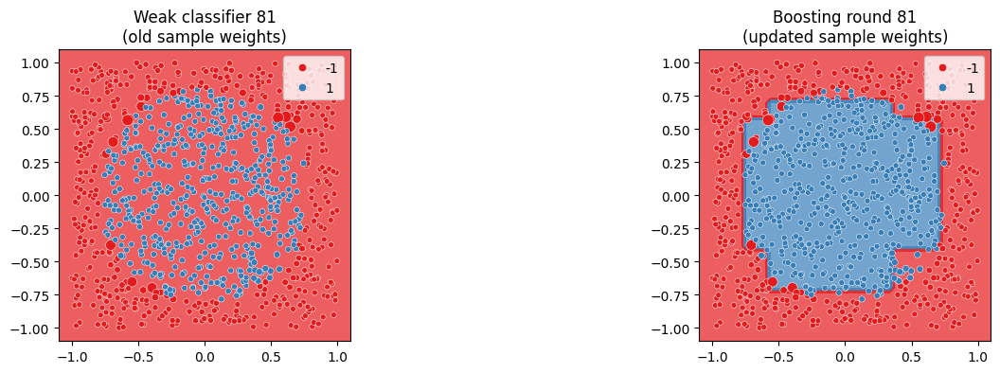

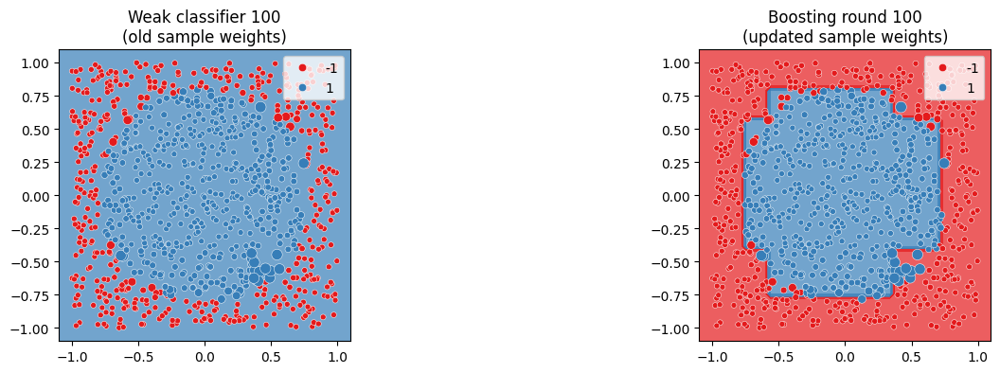

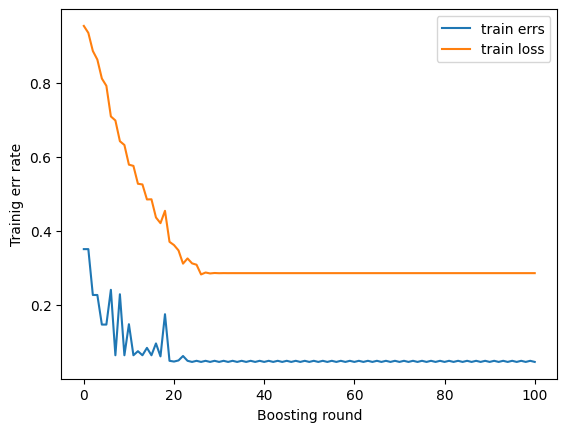

In [39]:
T = 101
W = np.ones(Y.shape)

grid_scores = 0
Y_scores = 0

H = []
train_errs = []
train_loss = []

XGrid, XGridFlat = get_grid(X)

for t in range(T):
    f_t = tree.DecisionTreeClassifier(max_depth=1).fit(X, Y, W)
    err_t = ((f_t.predict(X) != Y) * W).mean()
    if err_t > 0.5:
        print("No weak classifier found")
        break
    alpha_t = 0.5 * np.log((1 - err_t) / err_t)
    H.append((alpha_t, f_t))
    W_old = W
    W = W_old * np.exp(-alpha_t * Y * f_t.predict(X))

    grid_scores += alpha_t * f_t.predict(XGridFlat)
    Y_scores += alpha_t * f_t.predict(X)

    train_loss.append(np.exp(-Y_scores * Y).mean())
    train_errs.append((np.sign(Y_scores) != Y).mean())
    if np.ceil(np.sqrt(t)) != np.ceil(np.sqrt(t + 1)):
        plot_boost_round(
            t, X, Y, W_old, XGrid, f_t.predict(XGridFlat), np.sign(grid_scores)
        )

plt.figure()
plt.plot(train_errs, label="train errs")
plt.plot(train_loss, label="train loss")
plt.xlabel("Boosting round")
plt.ylabel("Trainig err rate")
plt.legend()

### Real data example

In [40]:
german_df = pd.read_csv(
    "https://archive.ics.uci.edu/ml/machine-learning-databases/statlog/german/german.data-numeric",
    names=[f"A{d}" for d in range(1, 25)] + ["target"],
    header=None,
    sep="\s+",
)
# Targets are 1&2, change to -1&+1
german_df["target"] = german_df["target"] * 2 - 3

german_train_df, german_test_df = model_selection.train_test_split(
    german_df, test_size=0.3
)
X = np.array(german_train_df[german_df.columns[:-1]])
Y = np.array(german_train_df["target"])

testX = np.array(german_test_df[german_df.columns[:-1]])
testY = np.array(german_test_df["target"])

In [41]:
german_df.head()

,A1,A2,A3,A4,A5,A6,A7,A8,A9,A10,...,A16,A17,A18,A19,A20,A21,A22,A23,A24,target
0,1,6,4,12,5,5,3,4,1,67,...,0,0,1,0,0,1,0,0,1,-1
1,2,48,2,60,1,3,2,2,1,22,...,0,0,1,0,0,1,0,0,1,1
2,4,12,4,21,1,4,3,3,1,49,...,0,0,1,0,0,1,0,1,0,-1
3,1,42,2,79,1,4,3,4,2,45,...,0,0,0,0,0,0,0,0,1,-1
4,1,24,3,49,1,3,3,4,4,53,...,1,0,1,0,0,0,0,0,1,1


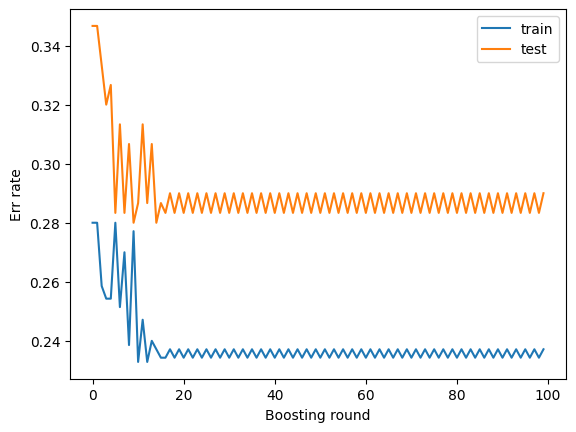

In [42]:
T = 100
W = np.ones(Y.shape)

H = []

Y_scores = 0
train_errs = []
train_loss = []

testY_scores = 0
test_errs = []

for t in range(T):
    f_t = tree.DecisionTreeClassifier(max_depth=1).fit(X, Y, W)
    err_t = ((f_t.predict(X) != Y) * W).mean()
    if err_t > 0.5:
        print("No weak classifier found")
        break
    alpha_t = 0.5 * np.log((1 - err_t) / err_t)
    H.append((alpha_t, f_t))
    W *= np.exp(-alpha_t * Y * f_t.predict(X))

    Y_scores += alpha_t * f_t.predict(X)
    train_errs.append((np.sign(Y_scores) != Y).mean())
    train_loss.append(np.exp(-Y_scores * Y).mean())

    testY_scores += alpha_t * f_t.predict(testX)
    test_errs.append((np.sign(testY_scores) != testY).mean())

plt.figure()
plt.plot(train_errs, label="train")
# plt.plot(train_loss, label='train loss')
plt.plot(test_errs, label="test")
plt.xlabel("Boosting round")
plt.ylabel("Err rate")
_ = plt.legend()

# Boosting as Optimization

We will now learn the connection between AdaBoost and learning methods such as regressions that optimize loss functions. We will first show that AdaBoost optimizes a particular loss function. We will then see how to design generic boosting algorithms which optimize any loss function.

## AdaBoost Optimizes a Loss Function

We will now prove, that AdaBoost provably reduces the training error in each round during which a weak classifier is found.

We will first show that AdaBoost is in fact minimizing a loss function, $L=\frac{1}{N}\sum_{i=1}^N e^{-y^i F(x^i)}$. Define $L_t$ to be the loss after the $t$-th iteration:
$$
\begin{split}
L_t &= \frac{1}{N}\sum_{i=1}^N e^{-y^i F_t(x^i)}  = \frac{1}{N}\sum_{i=1}^N e^{-y^i \sum_{t'=1}^t\alpha_{t'} f_{t'}(x^i)} \\
&= \frac{1}{N}\sum_{i=1}^N e^{-y^i F_{t-1}(x^i)}e^{- y^i \alpha_t f_t(x^i)} \\
&= \frac{1}{N}\sum_{i=1}^N w_t^i e^{- y^i \alpha_t f_t(x^i)} \\
&= \frac{1}{N}\left[ 
    \sum_{i:y^i = f_t(x^i)} w_t^i e^{-\alpha_t} +
    \sum_{i:y^i \neq f_t(x^i)} w_t^i e^{\alpha_t} +
    \sum_{i:y^i \neq f_t(x^i)} \left( w_t^i e^{-\alpha_t} - w_t^i e^{-\alpha_t} \right)
    \right] \\
&= \frac{1}{N}\left[
    \sum_i w_t^i e^{-\alpha_t} + \sum_{i:y^i \neq f_t(x^i)} w_t^i \left( e^{\alpha_t} - e^{-\alpha_t}\right)
    \right] 
\end{split}
$$

Let's try to minimize this expression over $\alpha_t$ and $f_t(x)$! A couple of observations:
1. $\sum_i w_t^i e^{-\alpha_t}$ doesn't depend on $f_t$, classifier chosen in round $t$
2. For any $\alpha_t > 0$ we get $\left(e^{\alpha_t} - e^{-\alpha_t}\right)$ is a positive constant: $\left(e^{\alpha_t} - e^{-\alpha_t}\right) = \textrm{const} > 0$.

Thus, we can do the minimization in two steps:
1. First, choose the optimal $f_t(x)$. It has to minimize $\sum_{i:y^i \neq f_t(x^i)} w_t^i$, or in other words make the smallest amount of weighted errors. This is exactly what AdaBoost does when it trains a weak classifier!
2. Having chosen an $f_t(x)$, choose its optimal $\alpha_t$ under the constraint $\alpha_t > 0$.

It is straightforward (and left as a homework exercise) to show that the optimal $\alpha_t = \frac{1}{2}\log\frac{1-\epsilon_t}{\epsilon_t}$, which corresponds to AdaBoost operation.

### Reducing exponential loss reduces error rate

Finally, we will show that the exponential loss bounds the error rate of the boosted classifier:

$$
\begin{split}
\text{err rate}_t &= \frac{1}{N}\sum_{1}^N [y^i \neq \mathrm{sign}(F_t(x^i))] \\
&= \frac{1}{N}\sum_{1}^N \begin{cases}
1 & \text{if } y^i \neq \mathrm{sign}(F_t(x^i)) \\
0 & \text{otherwise} \\
\end{cases} \\
&\leq \frac{1}{N}\sum_{1}^N \begin{cases}
e^{\alpha_t} & \text{if } y^i \neq \mathrm{sign}(F_t(x^i)) \\
e^{-\alpha_t} & \text{otherwise} 
\end{cases} \\
&= \frac{1}{N}\sum_{1}^N e^{-y^i F_t(x^i)} = L_t
\end{split}
$$

Thus the loss function minimized by AdaBoost upper-bounds the error rate of the boosted classifier.



### Relationship between AdaBoost's and Logistic Regression loss functions

We have just demonstrated that AdaBoost optimizes a loss function. We can compare it to the loss used by Logistic Regression.

Both AdaBoost and Logistic regression compute a score $h(x)$:
- In AdaBoost $F_{AB}(x) = \sum_t \alpha_t f_t(x)$, where $f_t$ is the $t-$th weak learner and $\alpha_t$ is its corresponding weigth.
- In Logistic Regression $F_{LR}(x) = \sum_j \Theta_j x_j$ with $\Theta$ a parameter vector.

Likewise, both methods have the same decision rule $y=1$ if and only if $F(x) \geq 0$.

Finally, both are trained to minimize a loss function:
- AdaBoost minimizes the exponential loss:
$$
\begin{cases}
e^{-F_{AB}(x)}&\text{ if }y=1 \\
e^{F_{AB}(x)}&\text{ if }y\neq 1
 \end{cases}
 =e^{-y F_{AB}(x)}
 $$ when $y\in\{-1, 1\}$
- Logistic Regression minimizes the $nll$:
$$
\begin{split}
nll &= \begin{cases}
-\log p(y=1|x)&\text{ if }y=1 \\
-\log(1 - p(y=1|x))&\text{ if }y\neq 1
\end{cases} \\
 &= -y \log p(y=1|x) - (1-y)\log(1 - p(y=1|x)) \\
 &= -y \log \sigma(F_{LR}(x)) - (1-y)\log(1 - \sigma(F_{LR}(x)))
\end{split}
$$ when $y\in\{0,1\}$.

To get a better insight into the relationship between the two functions we will find an alternative formulation for the Logistic Regression Loss.
$$
\begin{split}
nll &= \begin{cases}
-\log p(y=1|x)&\text{ if }y=1 \\
-\log(1 - p(y=1|x))&\text{ if }y\neq 1
\end{cases} \\
&= \begin{cases}
-\log \frac{1}{1+e^{-F_{LR}(x)}} &\text{ if }y=1 \\
-\log \frac{1}{1+e^{F_{LR}(x)}} &\text{ if }y\neq 1
\end{cases} \\
&= \log(1+e^{-y F_{LR}(x)})
\end{split}
$$ when $y\in\{-1, 1\}$.

Thus, we can alternatively view the logistic regression loss as $\log(1+e^{-y F_{LR}(x)})$ when targets are encoded into $\pm 1$.

Below we plot 3 loss functions for the case when $y=1$:
- the 0-1 loss $\text{sign}(F(x)) = 1$,
- the exponential loss from AdaBoost $e^{-yF(x)}$,
- the cross-entropy from Logistic Regression $\log(1+e^{-yF(x)})$

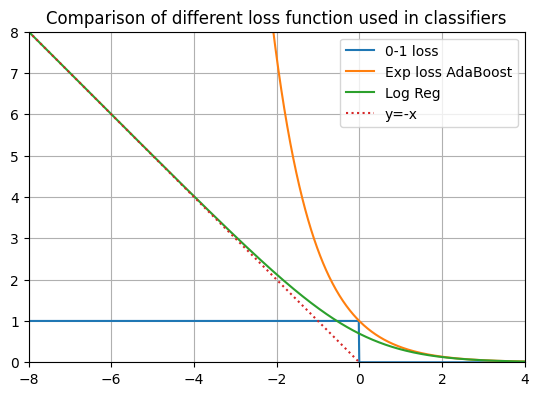

In [43]:
h = np.linspace(-8, 4, 1000)
plt.plot(h, h < 0, label="0-1 loss")
plt.plot(h, np.exp(-h), label="Exp loss AdaBoost")
plt.plot(h, np.log(1 + np.exp(-h)), label="Log Reg")
plt.plot([h[0], 0], [-h[0], 0], ":", label="y=-x")
plt.axis("square")
plt.ylim(0, -h[0])
plt.xlim(h[0], h[-1])
plt.grid(True)
plt.title("Comparison of different loss function used in classifiers")
plt.legend()

As we can see, both exponential loss, and the logistic loss (after scaling) can be seen as convex upper bounds on the 0-1 loss:
- they both tend to zero if the model is confidently correct,
- they both grow to infinity if the model is confidently incorrect.

However, while logistic regression's loss grows linearly with the magnitude of the error,  Adaboost's loss grows exponentially fast. This has a practical implication: a model trained with the AdaBoost's loss will make more to avoid training misclassifications, which can make the model more prone to outliers.

Using the neg-log-likelihood in boosting is popular. It was developed in the [LogitBooost algorithm](https://projecteuclid.org/download/pdf_1/euclid.aos/1016218223). [XGBoost](https://en.wikipedia.org/wiki/XGBoost), a popular boosting framework that we describe below supports many other loss functions.

## Boosting the Least Squares Loss

We will now see how to use Boosting with other loss functions. To get some intuitions, let's apply tree boosting to regression with a least squares criterion.

Our model after $T$ rounds of boosting will again be a collection of weak learners (simple regressors) $f_t(x)$: 

$$
F_T(x) = \sum_{t=1}^T \alpha_t f_T(x).
$$

The loss at round $T$ is simply
$$
L_T = \sum_{i=1}^N \left(y^i - F_T(x^i)\right)^2.
$$

Let's rewrite the loss to highlight the contribution from the $T$-th

$$
L_T = \sum_{i=1}^N \left(y^i - F_T(x^i)\right)^2 = \sum_{i=1}^N \left(y^i - \sum_{t=1}^T \alpha_t f_t(x^i)\right)^2 = \sum_{i=1}^N \left((y^i - F_{T-1}(x^i)) - \alpha_T f_T(x^i)\right)^2 = \sum_{i=1}^N \left(r_T^i - \alpha_T f_T(x^i)\right)^2
$$
where we defined $r_T^i = (y^i - F_{T-1}(x^i))$ and $r_0^i = y^i$.

We can see that in this case boosting will consists of repeatedly fitting the residuals from previous models.

Let's see an example.

Text(0.5, 1.0, 'X-Y relation to learn')

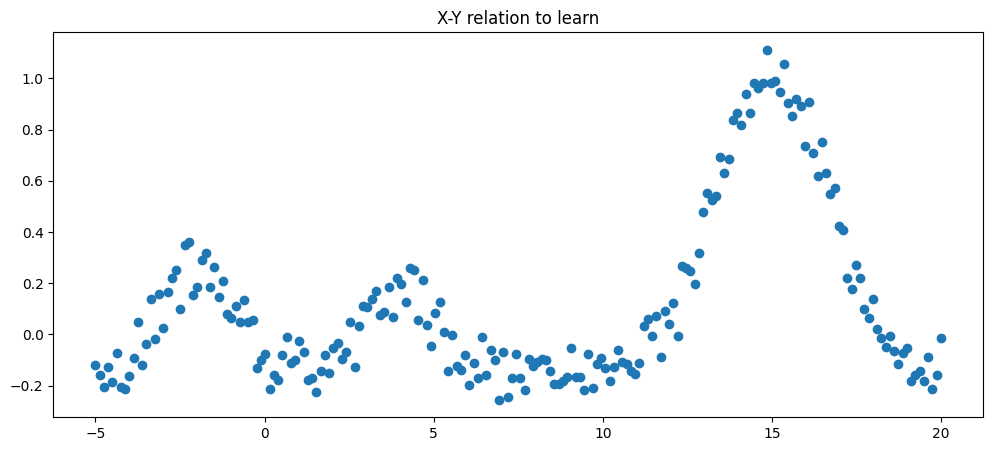

In [44]:
# Data Generation
X = np.linspace(-5, 20, 200)
Y = (
    1 / np.sqrt(2 * np.pi) * np.exp(-((X + 2) ** 2) / (2))
    + 1 / np.sqrt(2 * np.pi) * np.exp(-((X - 4) ** 2) / (2)) * 0.8
    + 1 / np.sqrt(2 * np.pi) * np.exp(-((X - 15) ** 2) / (5)) * 3
)
Y -= np.mean(Y)

Y += np.random.rand(200) / 4

plt.figure(figsize=(12, 5))
plt.scatter(X, Y)
plt.title("X-Y relation to learn")

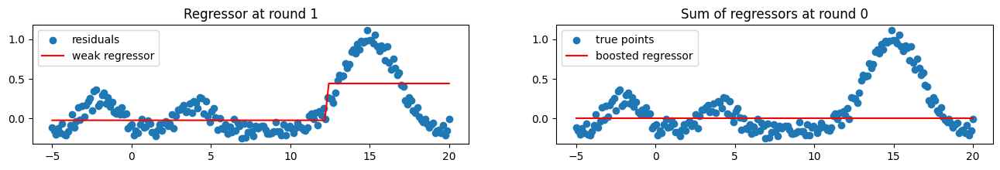

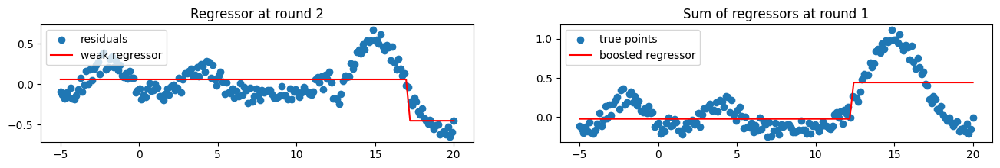

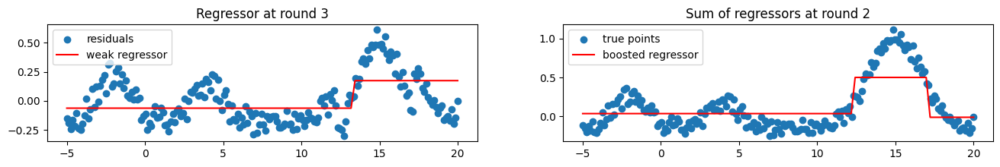

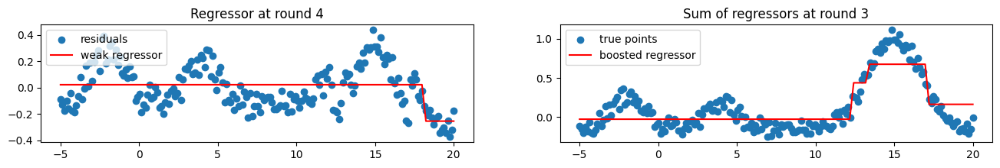

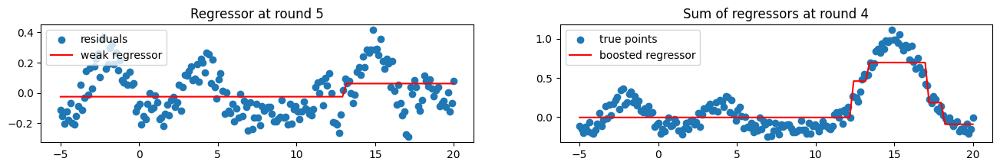

...

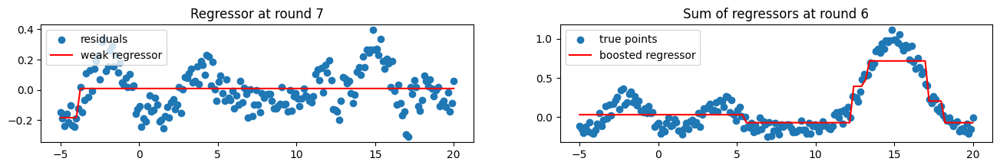

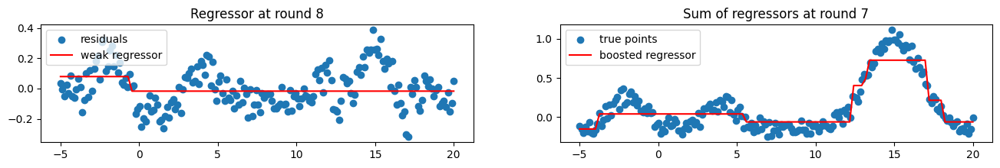

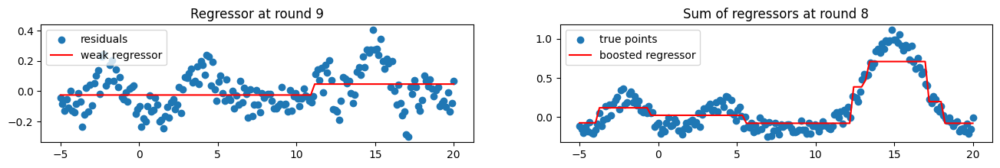

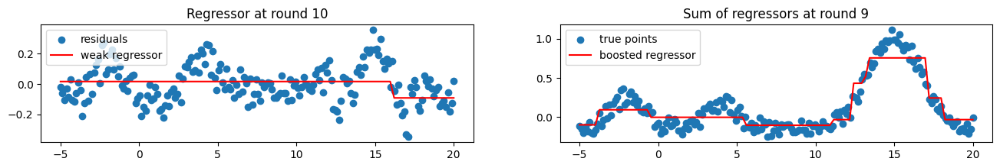

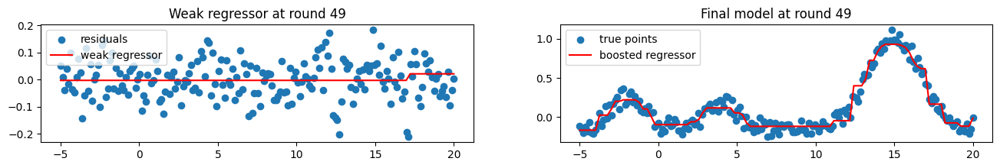

In [46]:
T = 50
X_plot = np.linspace(X.min(), X.max(), 100)
final_preds = np.zeros_like(X_plot)

r = Y
for t in range(T):
    f_t = tree.DecisionTreeRegressor(criterion="squared_error", max_depth=1).fit(X[:, None], r)

    if t < 10:        
        plt.figure(figsize=(16,2))
        plt.subplot(1,2,1)
        plt.scatter(X, r, label="residuals")
        plt.plot(
            X_plot, f_t.predict(X_plot[:, None]), label="weak regressor", color="r"
        )
        plt.title(f"Regressor at round {t+1}")
        plt.legend(loc="upper left")
        
        plt.subplot(1,2,2)
        plt.scatter(X, Y, label="true points")
        plt.plot(
            X_plot, final_preds, label="boosted regressor", color="r"
        )
        plt.title(f"Sum of regressors at round {t}")
        plt.legend(loc="upper left")
        

    r = r - f_t.predict(X[:, None])
    final_preds = final_preds + f_t.predict(X_plot[:, None])

plt.figure(figsize=(16,2))
plt.subplot(1,2,1)
plt.scatter(X, r, label="residuals")
plt.plot(
    X_plot, f_t.predict(X_plot[:, None]), label="weak regressor", color="r"
)
plt.title(f"Weak regressor at round {t}")
plt.legend(loc="upper left")

plt.subplot(1,2,2)
plt.scatter(X, Y, label="true points")
plt.plot(
    X_plot, final_preds, label="boosted regressor", color="r"
)
plt.title(f"Final model at round {t}")
plt.legend(loc="upper left")

None

## Generalizing Boosting to Other Loss Functions

**NB** Gradient Boosting is optional and it is not required to understand XGBoost below.

We were able to easily write a boosting algorithm for regression, because we already had decision trees which minimize the MSE loss. However, other loss functions, such as the negative log-likelihood from logistic regression, or robust regression losses such as Huber do not necessarily allow easy learning of weak learners that optimize them.

Suppose for a moment that our goal is to learn the values that our model should return at the training  data points. In other words, we treat $F$ as a vector 
$$
F = [F^1, F^2, ..., F^N]
$$
where $F_i$ is the desired output of our model for training sample $x^i$, and we keep using the upper index for sample enumeration.

Suppose we wish to minimize our loss function over the vector $F$:
$$
\min_F \frac{1}{N} \sum_{i=1}^N L(Y^i, F^i).
$$

To develop intuitions about the _gradient boosting method_ we will not simply set $F^i = Y^i$, but instead observe what gradient descent would do to find the vector $F$. The algorithm would work as follows:
1. Set the initial vector $F_0 = 0$  (i.e., $F_0$ is a vector of values associated with all data samples, i.e. a vector of $N$ zeros).
2. For $t$ in $1...T$:
    1. Compute the derivative $g_t = \frac{\partial L}{\partial F}$
    2. Set $F_t = F_{t-1} - \alpha_t g_t$

Thus we express the vector of model outputs $F$ by a sum of gradients of the loss function.

Gradient Boosting will approximate this procedure, however it will not store a vector of model responses, but it will compute them using a model expressed as a sum of learners:

1. $F_0(x) = 0$ the first model is empty and returns $0$ for all $x$.
2. For $t$ in $1...T$:
    1. Find an approximation to the derivative $\frac{\partial L}{\partial F}$:
        1. Compute the vector of derivatives of the loss with respect to model outputs on all training samples:
            $$ 
            r^i_t = \left[\frac{\partial L\left(y^i, F_{t-1}(x^i)\right)}{\partial F_{t-1}(x^i)}\right]
            $$
        2. Fit a regressor $f_t(x)$ to the vector of derivatives $r_t$: it will approximate the gradient on data samples.
    2. Set $F_t(x) = F_{t-1}(x) + \alpha_t f_t(x)$

Notice that gradient boosting is just an approximation to fitting a table of model outputs: since the model outputs for different samples are not independent (they are all computed by a model) we cannot arbitrarily change them. Thus the best we can do is to find an addition to the model, which would approximate the gradient! However, a table function doesn't generalize. Our boosted model does!

Please note, that for the square loss $\frac{\partial(y-f)^2}{\partial f} = 2(y-f)$ which means that gradient boosting applied to a mean squares criterion simply fits the regressor to the residuals from the previous stage, recovering the example above.

In the special case when the weak learner is a decision tree, we can fold the constants $\alpha$ into the tree. A tree assigns samples to leaf nodes, then returns the value associated with a given leaf. Rather than multiplying the values in all leaves by a single $\alpha$, we can re-learn the value in each leaf. In particular, assume that the tree fitted to gradients 
$r_t$ assigned each sample to one of $M$ leaves denoted $R_{t1},...,R_{tM}$, each returning the value $\omega_{tj}$. Rewrite the loss function at round $t$ as:

$$
\begin{split}
L_t &= \sum_i L(Y^i, F_{t-1}(x^i) + f_t(x^i)) \\
&= \sum_{j=1}^{M}\sum_{i\in R_{tj}}L(Y^i, F_{t-1}(x^i) + f_t(x^i)) \\
&=\sum_{j=1}^{M}\sum_{i\in R_{tj}}L(Y^i, F_{t-1}(x^i) + \omega_{tj}) 
\end{split}
$$

It is then usually easy to optimally fit the leaf values $\omega_{tj}$.

In [48]:
# @title Utility funs


def get_grid(X):
    Grid = np.meshgrid(
        np.linspace(X[:, 0].min() - 0.1, X[:, 0].max() + 0.1, 50),
        np.linspace(X[:, 1].min() - 0.1, X[:, 1].max() + 0.1, 50),
    )
    XGridFlat = np.concatenate(
        (Grid[0].reshape(-1, 1), Grid[1].reshape(-1, 1)), axis=-1
    )
    return Grid, XGridFlat


def plot_data(X, Y, W=None, XGrid=None, YGrid=None):
    pal2 = sns.color_palette("Set1")[:2]
    if XGrid is not None:
        plt.contourf(
            XGrid[0],
            XGrid[1],
            YGrid.reshape(XGrid[0].shape),
            cmap="Set1",
            vmin=-1,
            vmax=9,
            alpha=0.7,
        )
    sns.scatterplot(x=X[:, 0], y=X[:, 1], size=W, hue=Y, palette=pal2)
    plt.axis("square")
    plt.xlim(X[:, 0].min() - 0.1, X[:, 0].max() + 0.1)
    plt.ylim(X[:, 1].min() - 0.1, X[:, 1].max() + 0.1)

    # Remove size from legend
    ax = plt.gca()
    # EXTRACT CURRENT HANDLES AND LABELS
    h, l = ax.get_legend_handles_labels()

    # COLOR LEGEND (FIRST 30 ITEMS)
    col_lgd = plt.legend(h[:2], l[:2], loc="upper right")


def plot_boost_round(t, X, Y, W_old, XGrid, weak_preds, gradboost_preds):
    plt.figure(figsize=(16, 4))
    plt.subplot(1, 2, 1)
    plot_data(X, Y, W_old, XGrid, weak_preds)
    plt.title(f"Weak classifier {t}\n(old sample weights)")

    plt.subplot(1, 2, 2)
    plot_data(X, Y, W_old, XGrid, gradboost_preds)
    plt.title(f"Boosting round {t}\n(updated sample weights)")
    
def plot_boost_round(t, X, Y, W_old, XGrid, weak_preds, gradboost_preds):
    plt.figure(figsize=(16, 4))
    plt.subplot(1, 2, 1)
    plot_data(X, Y, W_old, XGrid, weak_preds)
    plt.title(f"Weak classifier {t}\n(old sample weights)")

    plt.subplot(1, 2, 2)
    plot_data(X, Y, W_old, XGrid, gradboost_preds)
    plt.title(f"Boosting round {t}\n(updated sample weights)")

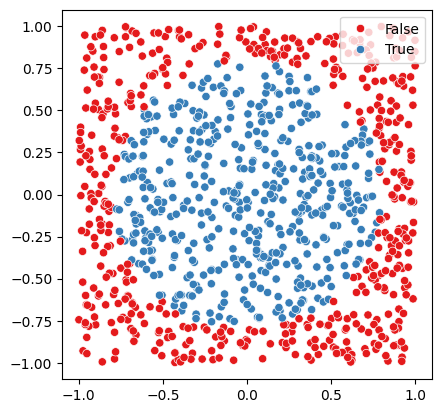

In [49]:
# Generate a nonlinearly separable dataset

# Circle dataset
X = np.random.rand(1000, 2) * 2 - 1
y = (X ** 2).sum(-1) < (2 / np.pi)

plot_data(X, y)

First the impossible one:
    
    Suppose for a moment that our goal is to learn the values that our model should return at the training  data points. In other words, we treat $F$ as a vector 
$$
F = [F^1, F^2, ..., F^N]
$$
where $F_i$ is the desired output of our model for training sample $x^i$, and we keep using the upper index for sample enumeration.

Suppose we wish to minimize our loss function over the vector $F$:
$$
\min_F \frac{1}{N} \sum_{i=1}^N L(Y^i, F^i).
$$

To develop intuitions about the _gradient boosting method_ we will not simply set $F^i = Y^i$, but instead observe what gradient descent would do to find the vector $F$. The algorithm would work as follows:
1. Set the initial vector $F_0 = 0$  (i.e., $F_0$ is a vector of values associated with all data samples, i.e. a vector of $N$ zeros).
2. For $t$ in $1...T$:
    1. Compute the derivative $g_t = \frac{\partial L}{\partial F}$
    2. Set $F_t = F_{t-1} - \alpha_t g_t$

Thus we express the vector of model outputs $F$ by a sum of gradients of the loss function.


In [50]:
y.shape

(1000,)

In [51]:
F = np.random.uniform(size=y.shape)


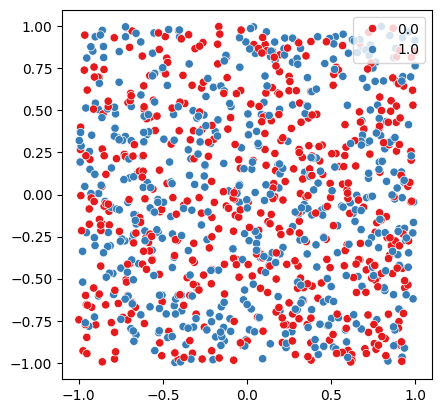

In [52]:
plot_data(X, np.round(F > 0.5))

In [53]:
def log_loss(y,p):
    p_trunc = p
    p_trunc = np.fmin( np.fmax(p,1e-3), 1-1e-3)
    
    return (-1.)*(y*np.log(p_trunc) + (1-y)*np.log(1-p_trunc))

def mah_log_grad(x):
    if x > 1e-3:
        return 1/x
    else:
        return 1/1e-3

def log_loss_gradient_p(y,p):
    p_trunc = p
    p_trunc = np.fmin( np.fmax(p,1e-3), 1-1e-3)
    return (-1.)*(y * 1/p_trunc - (1-y) * 1/(1-p_trunc))

In [54]:
r = log_loss_gradient_p(y,F)


In [55]:
print(((F > 0.5) == y).mean())

0.492


0.475


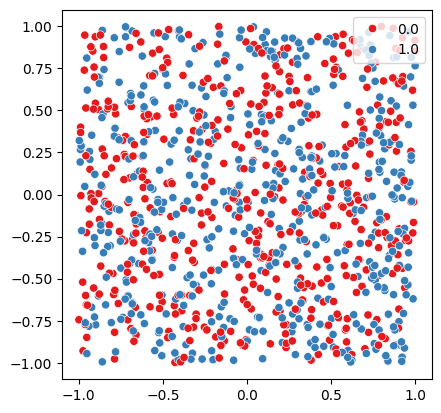

0.511


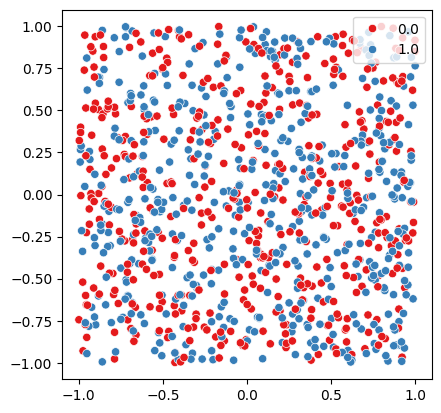

0.534


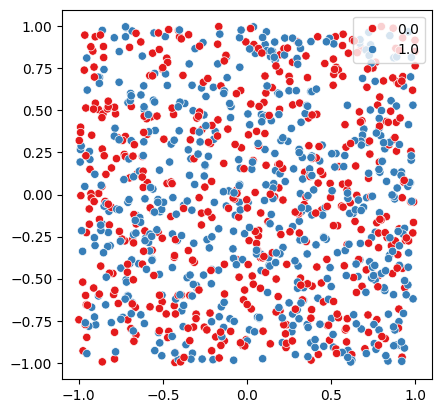

0.563


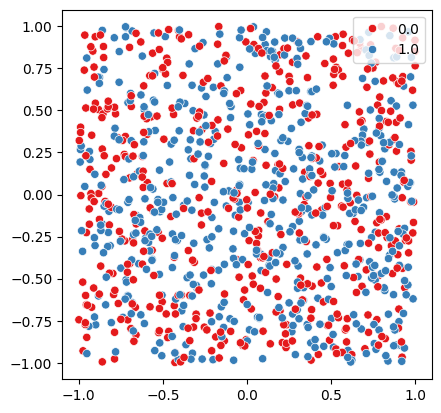

0.59


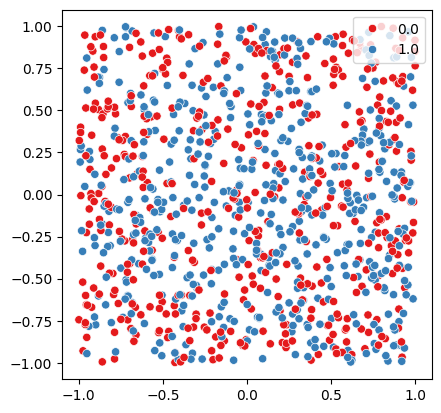

0.619


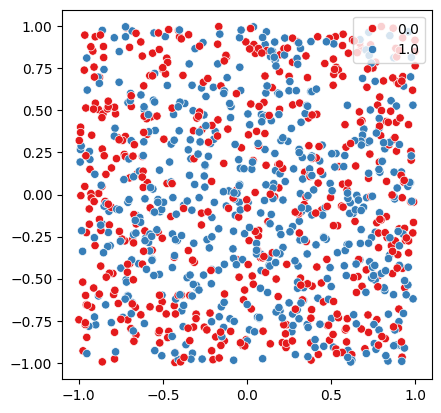

0.657


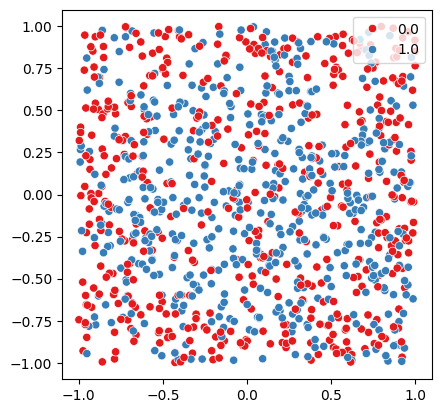

0.687


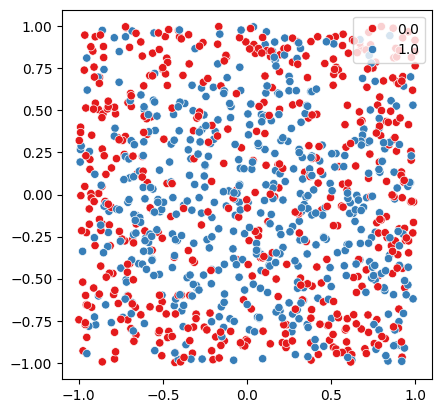

0.724


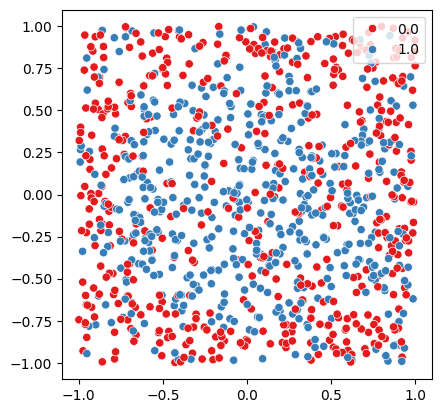

0.775


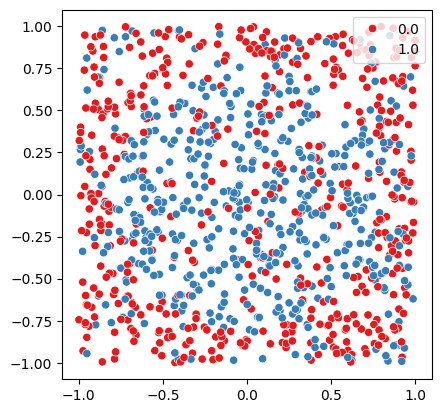

0.835


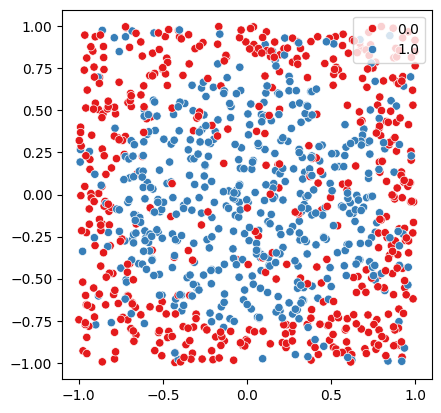

0.984


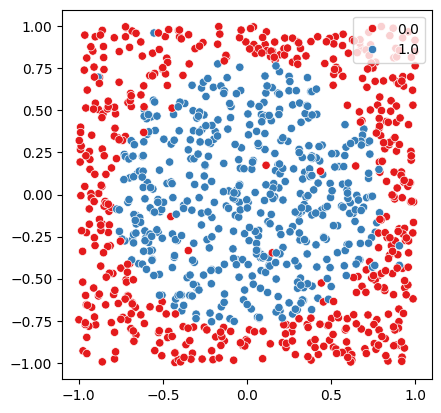

1.0


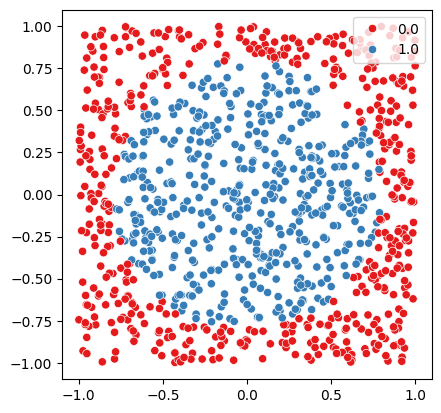

1.0


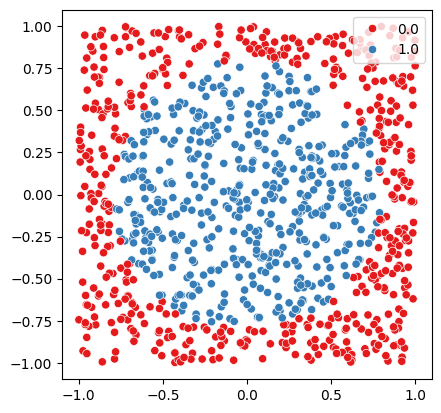

1.0


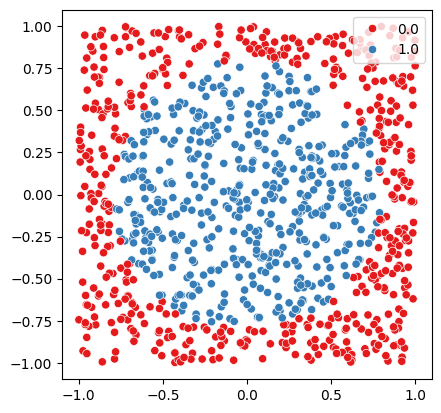

1.0


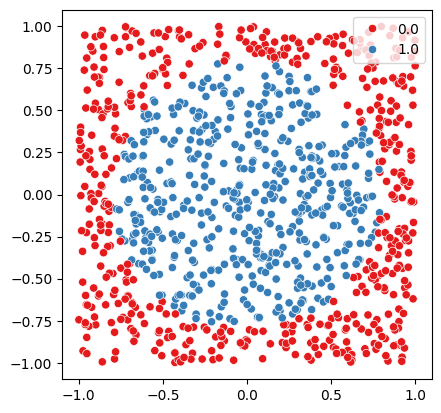

1.0


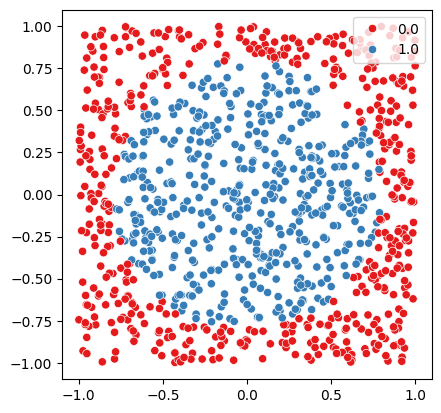

1.0


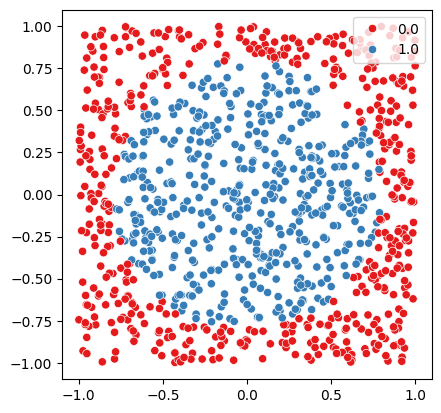

1.0


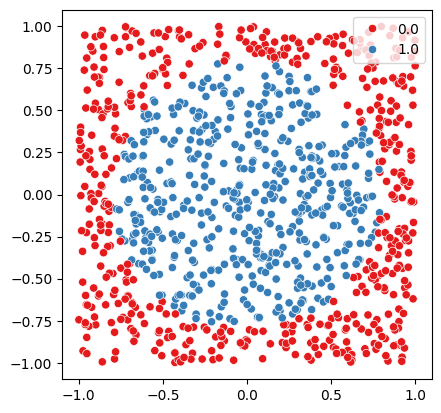

1.0


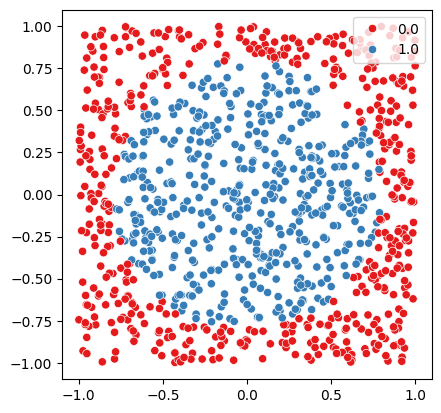

1.0


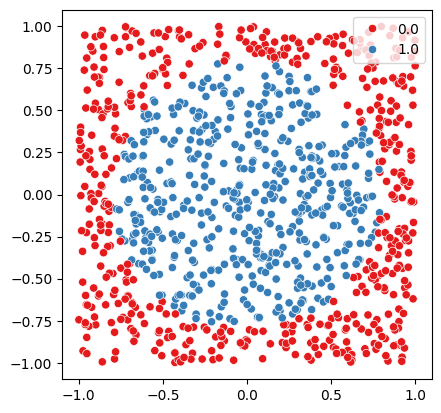

In [56]:
F = np.random.uniform(size=y.shape)
print(((F > 0.5) == y).mean())
plot_data(X, np.round(F > 0.5))
plt.show()

for t in range(20):
    f_t = (-1.)*log_loss_gradient_p(y,F)
    F = F + 0.01 * f_t #zamien na argmin
    print(((F > 0.5) == y).mean())
    plot_data(X, np.round(F > 0.5))
    plt.show()


In [22]:
from sklearn.tree import DecisionTreeRegressor

0.497


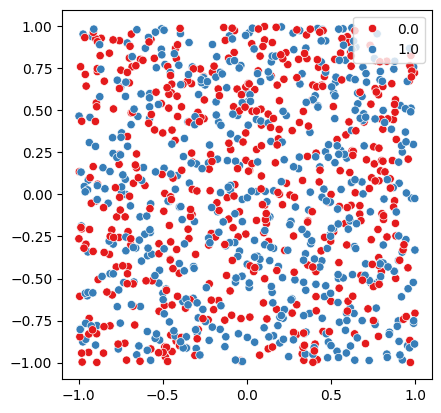

0 	 0.487 	 1.0962045681438695
1 	 0.575 	 2.453817629776114
2 	 0.51 	 3.3853103418713744
3 	 0.719 	 1.9417985931338264
4 	 0.833 	 1.1544285483678918
5 	 0.915 	 0.5880746565187106
6 	 0.915 	 0.5880746565187106
7 	 0.915 	 0.5389851378098152
8 	 0.889 	 0.48720473750422155
9 	 0.853 	 1.0106357970425788
10 	 0.867 	 0.5270323888166841
11 	 0.917 	 0.5742611469614135
12 	 0.827 	 1.1958690770397828
13 	 0.93 	 0.4844733348389823
14 	 0.93 	 0.4844733348389823
15 	 0.93 	 0.4844733348389823
16 	 0.867 	 0.9082185833735643
17 	 0.932 	 0.47065982528168526
18 	 0.934 	 0.4568463157243881
19 	 0.934 	 0.4568463157243881
20 	 0.934 	 0.4568463157243881
21 	 0.875 	 0.8643448476646527
22 	 0.936 	 0.44346426847320214
23 	 0.934 	 0.4568463157243881
24 	 0.936 	 0.4377657024294905
25 	 0.923 	 0.4740416367300823
26 	 0.935 	 0.44993956094573956
27 	 0.935 	 0.44993956094573956
28 	 0.871 	 0.8766483396016886
29 	 0.935 	 0.4449754892196945
30 	 0.934 	 0.4568463157243881
31 	 0.936 	 0.443

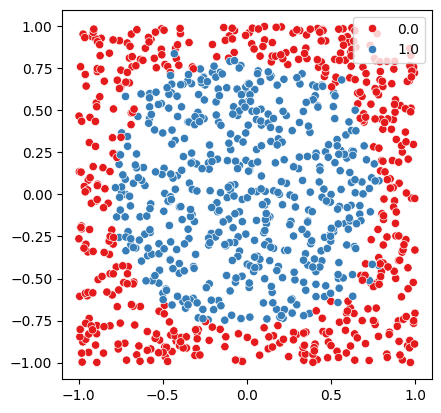

1701 	 0.985 	 0.029675213597248572
1702 	 0.985 	 0.030219443759352812
1703 	 0.985 	 0.028394897088298045
1704 	 0.985 	 0.02896648452112649
1705 	 0.985 	 0.029524606091281467
1706 	 0.984 	 0.030063110561784397
1707 	 0.984 	 0.030575732372330248
1708 	 0.984 	 0.031059535877198164
1709 	 0.984 	 0.03111135073754697
1710 	 0.985 	 0.029080343318754465
1711 	 0.985 	 0.029649794872979057
1712 	 0.985 	 0.0302081704082625
1713 	 0.984 	 0.030746500547607667
1714 	 0.984 	 0.031255627545581637
1715 	 0.985 	 0.029591916159108833
1716 	 0.985 	 0.03013014525438488
1717 	 0.985 	 0.028328342542493296
1718 	 0.985 	 0.02889832208909061
1719 	 0.985 	 0.029453612377448746
1720 	 0.984 	 0.029555487237822003
1721 	 0.984 	 0.030119530878321556
1722 	 0.984 	 0.03066364404378498
1723 	 0.985 	 0.028837321489414047
1724 	 0.985 	 0.029409683149789877
1725 	 0.985 	 0.029968765391447834
1726 	 0.985 	 0.03051403621723457
1727 	 0.984 	 0.03103311092401765
1728 	 0.984 	 0.03151888375292867
17

2125 	 0.982 	 0.031459199344851065
2126 	 0.982 	 0.031321525477373435
2127 	 0.982 	 0.03185900828173448
2128 	 0.982 	 0.030180366066658672
2129 	 0.982 	 0.03075021446475077
2130 	 0.982 	 0.028985564728296494
2131 	 0.982 	 0.029577684945371167
2132 	 0.981 	 0.03016076175401903
2133 	 0.981 	 0.030730169097821718
2134 	 0.981 	 0.0312824367273469
2135 	 0.981 	 0.03181448883607754
2136 	 0.982 	 0.030914447615605675
2137 	 0.982 	 0.031451818635076664
2138 	 0.983 	 0.031313525943136356
2139 	 0.983 	 0.03184718969817108
2140 	 0.984 	 0.02919526880510218
2141 	 0.985 	 0.027525446046110683
2142 	 0.985 	 0.028093302035801668
2143 	 0.984 	 0.02867334378440765
2144 	 0.984 	 0.029247574157961403
2145 	 0.983 	 0.029816944680741867
2146 	 0.982 	 0.03037155690231201
2147 	 0.982 	 0.030904859742833125
2148 	 0.982 	 0.031416132841131574
2149 	 0.982 	 0.03189843511545461
2150 	 0.982 	 0.03234327315252459
2151 	 0.983 	 0.030529364095108653
2152 	 0.985 	 0.030403690155646545
2153

2550 	 0.985 	 0.03143738219370641
2551 	 0.984 	 0.03197383343211296
2552 	 0.984 	 0.03247454241744114
2553 	 0.985 	 0.03022939495516231
2554 	 0.985 	 0.028418986374787604
2555 	 0.984 	 0.02900930505889444
2556 	 0.984 	 0.029597655719225506
2557 	 0.983 	 0.030188709434755243
2558 	 0.983 	 0.03077834058968858
2559 	 0.983 	 0.031350279347145196
2560 	 0.983 	 0.03190214506276844
2561 	 0.983 	 0.0324277391621015
2562 	 0.982 	 0.032919110742495164
2563 	 0.981 	 0.03337260439732405
2564 	 0.981 	 0.033786002831537224
2565 	 0.983 	 0.030984675748417078
2566 	 0.984 	 0.02873308953730453
2567 	 0.984 	 0.027805718075847537
2568 	 0.983 	 0.029263499395649845
2569 	 0.983 	 0.02985823664984237
2570 	 0.983 	 0.030446888363755985
2571 	 0.983 	 0.031027815936004278
2572 	 0.983 	 0.031596179370766246
2573 	 0.983 	 0.032140605549843625
2574 	 0.982 	 0.032657423990760784
2575 	 0.985 	 0.029907106042916815
2576 	 0.984 	 0.030465029092407617
2577 	 0.984 	 0.030991481087430703
2578

2980 	 0.984 	 0.03168128598948713
2981 	 0.984 	 0.03311154647530101
2982 	 0.982 	 0.03273939719466464
2983 	 0.982 	 0.03329957225368651
2984 	 0.983 	 0.03161957280175739
2985 	 0.983 	 0.03219781661689345
2986 	 0.983 	 0.03276976629201049
2987 	 0.983 	 0.03332579952244488
2988 	 0.983 	 0.03273799491912794
2989 	 0.983 	 0.03328139292293459
2990 	 0.983 	 0.033796441811420296
2991 	 0.983 	 0.03427793998605885
2992 	 0.983 	 0.03472440536320012
2993 	 0.984 	 0.03197726001696184
2994 	 0.984 	 0.031600217103446744
2995 	 0.983 	 0.03219160305418787
2996 	 0.983 	 0.0327722415314455
2997 	 0.982 	 0.03332974323849313
2998 	 0.982 	 0.03385664984615253
2999 	 0.983 	 0.03216569286300568
3000 	 0.983 	 0.03272747490467417
3001 	 0.983 	 0.03328083588064335
3002 	 0.983 	 0.03381046899000281
3003 	 0.983 	 0.034310023854949266
3004 	 0.983 	 0.03477483869937329
3005 	 0.983 	 0.035200965157767994
3006 	 0.983 	 0.03448892303815036
3007 	 0.984 	 0.03174083664685628
3008 	 0.984 	 0.

3395 	 0.98 	 0.03222956523096374
3396 	 0.98 	 0.032820088005630056
3397 	 0.98 	 0.03339664471569047
3398 	 0.98 	 0.033951820512206195
3399 	 0.98 	 0.03448130457106562
3400 	 0.98 	 0.034980975633232415
3401 	 0.98 	 0.03544711853692766
3402 	 0.98 	 0.03587706294555656
3403 	 0.98 	 0.03627105545347357
3404 	 0.98 	 0.03662450869784875
3405 	 0.98 	 0.03398653683477879
3406 	 0.981 	 0.030831210547190166
3407 	 0.981 	 0.03238443248439142
3408 	 0.98 	 0.0329800934688049
3409 	 0.979 	 0.03355882017870889
3410 	 0.979 	 0.03412011074842127
3411 	 0.979 	 0.03465667812815663
3412 	 0.979 	 0.03516244976074765
3413 	 0.98 	 0.03424895477822272
3414 	 0.98 	 0.03476808746246005
3415 	 0.98 	 0.03525554415561871
3416 	 0.98 	 0.035707732341986015
3417 	 0.98 	 0.03612420331921872
3418 	 0.98 	 0.036501369220277684
3419 	 0.98 	 0.03683727112536502
3420 	 0.98 	 0.03413286750730379
3421 	 0.981 	 0.03083529388257184
3422 	 0.981 	 0.031434155981740645
3423 	 0.98 	 0.032988060883348096

3821 	 0.979 	 0.034282564580299234
3822 	 0.979 	 0.034798681127830494
3823 	 0.979 	 0.035283043571116925
3824 	 0.979 	 0.035732670465933654
3825 	 0.98 	 0.03475001989699522
3826 	 0.98 	 0.036167108118062556
3827 	 0.98 	 0.03660722180981781
3828 	 0.979 	 0.03700590326270864
3829 	 0.979 	 0.03736169220438137
3830 	 0.98 	 0.034725618282462976
3831 	 0.98 	 0.03131674207339122
3832 	 0.98 	 0.031924850907442806
3833 	 0.98 	 0.032521926115390586
3834 	 0.98 	 0.03311123589550184
3835 	 0.98 	 0.03368690740534391
3836 	 0.98 	 0.03423939201567609
3837 	 0.98 	 0.034764923481313034
3838 	 0.98 	 0.035259983513369494
3839 	 0.98 	 0.03572148104167096
3840 	 0.979 	 0.036146931574010235
3841 	 0.979 	 0.036537686060771034
3842 	 0.979 	 0.03688953546710272
3843 	 0.979 	 0.037202456576588584
3844 	 0.979 	 0.036412368784594557
3845 	 0.979 	 0.03464631419349144
3846 	 0.98 	 0.033628399912724316
3847 	 0.983 	 0.03071944202387832
3848 	 0.983 	 0.031310708194601744
3849 	 0.982 	 0.0

4248 	 0.981 	 0.03184015652583538
4249 	 0.981 	 0.03243629720678099
4250 	 0.98 	 0.0330221782291553
4251 	 0.98 	 0.03358737109524526
4252 	 0.98 	 0.03412671064526047
4253 	 0.98 	 0.03463623916872038
4254 	 0.98 	 0.035112355548566385
4255 	 0.979 	 0.03555355294701514
4256 	 0.979 	 0.03595786781218475
4257 	 0.979 	 0.03632171834788659
4258 	 0.978 	 0.03664486267195084
4259 	 0.979 	 0.03394896651566852
4260 	 0.979 	 0.03536736656882384
4261 	 0.98 	 0.034376284387773626
4262 	 0.981 	 0.031245094697016015
4263 	 0.981 	 0.031851805747676425
4264 	 0.981 	 0.03245173441634895
4265 	 0.98 	 0.033036628785068134
4266 	 0.98 	 0.03360095737229222
4267 	 0.98 	 0.03414055301906294
4268 	 0.98 	 0.034651362363238396
4269 	 0.98 	 0.03513291744649529
4270 	 0.98 	 0.03558203265717543
4271 	 0.98 	 0.0359932496077355
4272 	 0.98 	 0.03636386052003216
4273 	 0.98 	 0.03372181119904761
4274 	 0.979 	 0.03517631376419149
4275 	 0.98 	 0.03215072432091154
4276 	 0.981 	 0.031330060956902

4672 	 0.979 	 0.03665129176285352
4673 	 0.979 	 0.03357202662588303
4674 	 0.978 	 0.034135860185431764
4675 	 0.978 	 0.03467368128935138
4676 	 0.978 	 0.03518141602072807
4677 	 0.978 	 0.03565530348575459
4678 	 0.979 	 0.034727428399477074
4679 	 0.979 	 0.03458143286703862
4680 	 0.979 	 0.03510699765389444
4681 	 0.98 	 0.033418505117044854
4682 	 0.979 	 0.03399387358821208
4683 	 0.979 	 0.03455700415584205
4684 	 0.979 	 0.035098579033093644
4685 	 0.979 	 0.035614669598436455
4686 	 0.979 	 0.036101926173271695
4687 	 0.979 	 0.036557392908200544
4688 	 0.981 	 0.033548853016098175
4689 	 0.98 	 0.03406236953381598
4690 	 0.98 	 0.03454039888780923
4691 	 0.981 	 0.03226811553389774
4692 	 0.981 	 0.03374952449555142
4693 	 0.981 	 0.0342897525902746
4694 	 0.98 	 0.03174448661712674
4695 	 0.98 	 0.032350632802978
4696 	 0.979 	 0.03295338294084151
4697 	 0.979 	 0.033547548378818175
4698 	 0.979 	 0.03412701106465041
4699 	 0.979 	 0.03468830833468134
4700 	 0.979 	 0.03

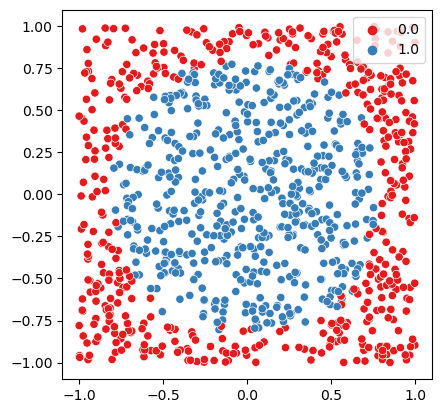

In [23]:
np.random.seed(2023)
F = np.random.uniform(size=y.shape)
print(((F > 0.5) == y).mean())
plot_data(X, np.round(F > 0.5))
plt.show()

for t in range(5000):
    r = (-1.)*log_loss_gradient_p(y,F)
    tree = DecisionTreeRegressor(max_depth=1)
    tree.fit(X, r)
    f_t = tree.predict(X)
    
    
    alpha_t = 0.1
    #add to the ensemble
    F = F + alpha_t * f_t #zamien na argmin
    print(t, "\t", ((F > 0.5) == y).mean(), "\t",  log_loss(y,F).mean())
    
plot_data(X, np.round(F > 0.5))
plt.show()


In [24]:
np.set_printoptions(suppress=True)
np.round(F,1)

array([  96.5,   36.9,  -38.4,   79. ,  -42.4,  -63.4,   11.4,  -25.9,
         96.7,   23.7,   19.6,   24.8,   96.6,   -0.1,   28.9,  -22. ,
          0.1,   84.8, -126.7,  -26.6, -519.1,  -21.9,   23.5,  -48.5,
         96.4,   28.6,   -9.5,   36.6,   85. ,    8.7,   85.4,   23.9,
        -38.3,  -73.5,   29.3,   97.2,   -4.4,    8.2, -546.8,   35.5,
        -13.7, -519.3,   33.1,  -26. ,  -15. ,   29.5,  -56. ,  -55.7,
         39. , -519.8,   36.6,   80. ,   32.4,   96.6,   31.7,   32.9,
       -135.8,   24.5,  -35.7,    8.6,  107.8, -462.7,   33.1,   29.5,
         32.5,  -21.8,  -55.9,  -66.1,   29.5,   15.4,   27.7,  -10. ,
         15.4,   -2.8,   85.2,  -44. ,  -10.6,   23.7,  -63.5,   12.4,
         -4.4, -527.1,   72.4,  -52.6,   29.1,   40. ,  -84.1,    9. ,
        -11.8,  -68.9,   22.7,  -56.1,  -48.5,   21.9,    0.2,   85.3,
        -45. ,   40.7,    0.2, -522.8,  -55.5,  -31.5,   31.3,    8.5,
       -518.7,   96.5,    0.7,  -67.8, -462.8,   36.1, -463.3,   -3.7,
      

In [25]:
alpha_space = np.linspace(0, 10,100)[1:]


0.497


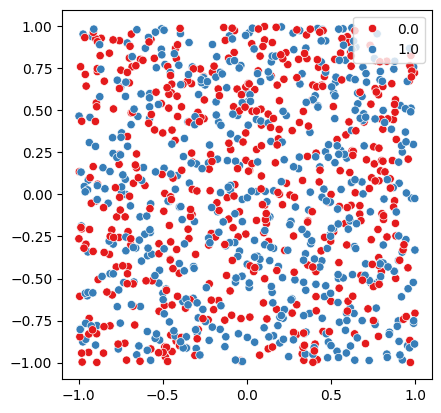

0 	 0.487 	 1.1004699019545174 	 0.10101010101010101
1 	 0.591 	 2.467581345993754 	 0.20202020202020202
2 	 0.51 	 3.3853103418713744 	 0.10101010101010101
3 	 0.719 	 1.9417985931338264 	 0.10101010101010101
4 	 0.833 	 1.1544285483678918 	 0.10101010101010101
5 	 0.915 	 0.5880746565187106 	 0.10101010101010101
6 	 0.915 	 0.5333382411727497 	 0.20202020202020202
7 	 0.904 	 0.49903369776792517 	 0.10101010101010101
8 	 0.85 	 1.0370137171308667 	 0.10101010101010101
9 	 0.827 	 0.9050676021773387 	 0.10101010101010101
10 	 0.928 	 0.49307708436597963 	 0.10101010101010101
11 	 0.921 	 0.48588584633216325 	 0.20202020202020202
12 	 0.921 	 0.48570517192368284 	 0.10101010101010101
13 	 0.861 	 0.9064978579725081 	 0.40404040404040403
14 	 0.928 	 0.4574127698216371 	 0.30303030303030304
15 	 0.928 	 0.4574150269954306 	 0.10101010101010101
16 	 0.928 	 0.4574422405661647 	 0.10101010101010101
17 	 0.929 	 0.4574955621388508 	 0.10101010101010101
18 	 0.929 	 0.4575759624114529 	 0.1

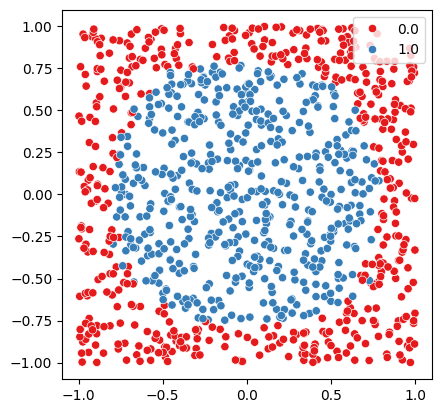

621 	 0.979 	 0.03160001189628253 	 0.10101010101010101
622 	 0.986 	 0.02374821347902409 	 0.6060606060606061
623 	 0.986 	 0.023703694477598687 	 0.10101010101010101
624 	 0.986 	 0.02433404998643545 	 0.10101010101010101
625 	 0.986 	 0.024990121110004735 	 0.10101010101010101
626 	 0.986 	 0.025655459329730797 	 0.10101010101010101
627 	 0.99 	 0.02085912778525942 	 0.6060606060606061
628 	 0.99 	 0.020493507924430672 	 0.10101010101010101
629 	 0.99 	 0.021099437732601225 	 0.10101010101010101
630 	 0.99 	 0.021736237100105065 	 0.10101010101010101
631 	 0.99 	 0.022391093811227655 	 0.10101010101010101
632 	 0.99 	 0.023054190381226306 	 0.10101010101010101
633 	 0.99 	 0.02371935701993484 	 0.10101010101010101
634 	 0.99 	 0.02437780316833272 	 0.10101010101010101
635 	 0.99 	 0.02039331778203401 	 0.5050505050505051
636 	 0.99 	 0.01949859329818571 	 0.10101010101010101
637 	 0.988 	 0.02011043445440872 	 0.10101010101010101
638 	 0.987 	 0.02073700559529925 	 0.101010101010101

777 	 0.994 	 0.012483925153752119 	 0.6060606060606061
778 	 0.994 	 0.012693461066279565 	 0.10101010101010101
779 	 0.994 	 0.01329728496929459 	 0.10101010101010101
780 	 0.993 	 0.014356800164512318 	 0.10101010101010101
781 	 0.993 	 0.014712592337406431 	 0.10101010101010101
782 	 0.993 	 0.015111784867293632 	 0.10101010101010101
783 	 0.993 	 0.015540435269914225 	 0.10101010101010101
784 	 0.993 	 0.016015397538521346 	 0.10101010101010101
785 	 0.993 	 0.016513882949926895 	 0.10101010101010101
786 	 0.991 	 0.017031942463107772 	 0.10101010101010101
787 	 0.991 	 0.017568669991407417 	 0.10101010101010101
788 	 0.991 	 0.01812339093836488 	 0.10101010101010101
789 	 0.99 	 0.019293831540631117 	 0.10101010101010101
790 	 0.99 	 0.019887337526167472 	 0.10101010101010101
791 	 0.989 	 0.02051891683557198 	 0.10101010101010101
792 	 0.989 	 0.0211739054975098 	 0.10101010101010101
793 	 0.989 	 0.021844163211533436 	 0.10101010101010101
794 	 0.989 	 0.022523260014998655 	 0.

933 	 0.988 	 0.02127323358320019 	 0.10101010101010101
934 	 0.987 	 0.02190099042436642 	 0.10101010101010101
935 	 0.987 	 0.02253978220024356 	 0.10101010101010101
936 	 0.986 	 0.023785499826200634 	 0.10101010101010101
937 	 0.985 	 0.024422981114918037 	 0.10101010101010101
938 	 0.984 	 0.025085484720749184 	 0.10101010101010101
939 	 0.984 	 0.025760052729515044 	 0.10101010101010101
940 	 0.984 	 0.026443840254942584 	 0.10101010101010101
941 	 0.983 	 0.02713475709179327 	 0.10101010101010101
942 	 0.982 	 0.027835202038364038 	 0.10101010101010101
943 	 0.981 	 0.028543213848848725 	 0.10101010101010101
944 	 0.981 	 0.02925117764560802 	 0.10101010101010101
945 	 0.981 	 0.029956263730504955 	 0.10101010101010101
946 	 0.981 	 0.03065517898456781 	 0.10101010101010101
947 	 0.989 	 0.021264572848358056 	 0.8080808080808081
948 	 0.989 	 0.021927862732030803 	 0.10101010101010101
949 	 0.994 	 0.015275925084802877 	 0.6060606060606061
950 	 0.994 	 0.015876488544503978 	 0.

1089 	 0.993 	 0.018155570124317736 	 0.10101010101010101
1090 	 0.993 	 0.0187750445286389 	 0.10101010101010101
1091 	 0.993 	 0.019416328280442142 	 0.10101010101010101
1092 	 0.993 	 0.013644252800410503 	 0.8080808080808081
1093 	 0.992 	 0.014272873841330075 	 0.10101010101010101
1094 	 0.992 	 0.015317641962883398 	 0.10101010101010101
1095 	 0.992 	 0.015778293202584077 	 0.10101010101010101
1096 	 0.991 	 0.016261540919433142 	 0.10101010101010101
1097 	 0.991 	 0.01676398130434184 	 0.10101010101010101
1098 	 0.991 	 0.017283374948709924 	 0.10101010101010101
1099 	 0.991 	 0.017820995197638977 	 0.10101010101010101
1100 	 0.99 	 0.018382435843382568 	 0.10101010101010101
1101 	 0.99 	 0.01958829885165819 	 0.10101010101010101
1102 	 0.99 	 0.020133910442954067 	 0.10101010101010101
1103 	 0.99 	 0.020701734863345287 	 0.10101010101010101
1104 	 0.99 	 0.02128814656985886 	 0.10101010101010101
1105 	 0.99 	 0.021890660164683447 	 0.10101010101010101
1106 	 0.987 	 0.022507400

1245 	 0.987 	 0.023385837002042414 	 0.10101010101010101
1246 	 0.987 	 0.024018508104627252 	 0.10101010101010101
1247 	 0.987 	 0.024673187458387 	 0.10101010101010101
1248 	 0.986 	 0.02534290042061391 	 0.10101010101010101
1249 	 0.985 	 0.026028727675117908 	 0.10101010101010101
1250 	 0.983 	 0.026724487865599188 	 0.10101010101010101
1251 	 0.983 	 0.027424359728252936 	 0.10101010101010101
1252 	 0.982 	 0.02812549952579516 	 0.10101010101010101
1253 	 0.99 	 0.01801253863698648 	 0.8080808080808081
1254 	 0.99 	 0.018625768813021044 	 0.10101010101010101
1255 	 0.989 	 0.019605550897789963 	 0.10101010101010101
1256 	 0.989 	 0.02019233398018985 	 0.10101010101010101
1257 	 0.994 	 0.0147605970824224 	 0.6060606060606061
1258 	 0.993 	 0.015626421970296567 	 0.10101010101010101
1259 	 0.993 	 0.016100042026320757 	 0.10101010101010101
1260 	 0.993 	 0.016607943668478464 	 0.10101010101010101
1261 	 0.993 	 0.017150294771151327 	 0.10101010101010101
1262 	 0.993 	 0.0177255072

1401 	 0.993 	 0.018975019798439834 	 0.10101010101010101
1402 	 0.993 	 0.019613037273202547 	 0.10101010101010101
1403 	 0.993 	 0.01408534074149667 	 0.7070707070707071
1404 	 0.993 	 0.014859677623873878 	 0.10101010101010101
1405 	 0.992 	 0.015353075509734013 	 0.10101010101010101
1406 	 0.992 	 0.015860556577420575 	 0.10101010101010101
1407 	 0.992 	 0.016959422242685106 	 0.10101010101010101
1408 	 0.991 	 0.017443248580382507 	 0.10101010101010101
1409 	 0.99 	 0.017949631694284943 	 0.10101010101010101
1410 	 0.989 	 0.018475062794460498 	 0.10101010101010101
1411 	 0.988 	 0.019023637027613276 	 0.10101010101010101
1412 	 0.988 	 0.019593182144209725 	 0.10101010101010101
1413 	 0.988 	 0.02017637929578129 	 0.10101010101010101
1414 	 0.988 	 0.020772217530093173 	 0.10101010101010101
1415 	 0.988 	 0.021976926144277896 	 0.10101010101010101
1416 	 0.988 	 0.022566642004121895 	 0.10101010101010101
1417 	 0.988 	 0.023174893958364737 	 0.10101010101010101
1418 	 0.986 	 0.0

1557 	 0.982 	 0.02686086814915034 	 0.10101010101010101
1558 	 0.982 	 0.027559473437616184 	 0.10101010101010101
1559 	 0.981 	 0.028267533029252973 	 0.10101010101010101
1560 	 0.981 	 0.028976764276415653 	 0.10101010101010101
1561 	 0.981 	 0.0296842026498774 	 0.10101010101010101
1562 	 0.981 	 0.030386433369855255 	 0.10101010101010101
1563 	 0.989 	 0.02079970143025358 	 0.8080808080808081
1564 	 0.989 	 0.0215155157939671 	 0.10101010101010101
1565 	 0.994 	 0.016131726466339265 	 0.5050505050505051
1566 	 0.994 	 0.01692098162001917 	 0.10101010101010101
1567 	 0.994 	 0.017517235262814092 	 0.10101010101010101
1568 	 0.994 	 0.018708654905828563 	 0.10101010101010101
1569 	 0.995 	 0.013092424242845182 	 0.8080808080808081
1570 	 0.993 	 0.013900714298120842 	 0.10101010101010101
1571 	 0.993 	 0.014363913857152829 	 0.10101010101010101
1572 	 0.992 	 0.014842823259149075 	 0.10101010101010101
1573 	 0.992 	 0.015336114511365977 	 0.10101010101010101
1574 	 0.992 	 0.0164535

1710 	 0.992 	 0.0153441850069484 	 0.10101010101010101
1711 	 0.992 	 0.01584933186295509 	 0.10101010101010101
1712 	 0.992 	 0.016981164921780017 	 0.10101010101010101
1713 	 0.991 	 0.01745929335887336 	 0.10101010101010101
1714 	 0.99 	 0.01796159954870845 	 0.10101010101010101
1715 	 0.989 	 0.01848397037503762 	 0.10101010101010101
1716 	 0.988 	 0.019030411409152688 	 0.10101010101010101
1717 	 0.988 	 0.019598104190487055 	 0.10101010101010101
1718 	 0.988 	 0.020179804098480105 	 0.10101010101010101
1719 	 0.988 	 0.020774418182353246 	 0.10101010101010101
1720 	 0.988 	 0.022008362245968763 	 0.10101010101010101
1721 	 0.988 	 0.02259511939532108 	 0.10101010101010101
1722 	 0.988 	 0.023200817601777224 	 0.10101010101010101
1723 	 0.986 	 0.02383280618658086 	 0.10101010101010101
1724 	 0.986 	 0.024483704577625894 	 0.10101010101010101
1725 	 0.986 	 0.02515114438599546 	 0.10101010101010101
1726 	 0.984 	 0.025827394688618825 	 0.10101010101010101
1727 	 0.984 	 0.0265164

1859 	 0.987 	 0.023727427364394923 	 0.10101010101010101
1860 	 0.987 	 0.02438338404426576 	 0.10101010101010101
1861 	 0.985 	 0.025060659083581186 	 0.10101010101010101
1862 	 0.985 	 0.025749921695342046 	 0.10101010101010101
1863 	 0.985 	 0.02645029007922949 	 0.10101010101010101
1864 	 0.984 	 0.027153048113232537 	 0.10101010101010101
1865 	 0.99 	 0.017373766934478743 	 0.8080808080808081
1866 	 0.99 	 0.017901352250228122 	 0.10101010101010101
1867 	 0.99 	 0.018780232614750297 	 0.10101010101010101
1868 	 0.99 	 0.019341914371421444 	 0.10101010101010101
1869 	 0.989 	 0.019936157446654817 	 0.10101010101010101
1870 	 0.989 	 0.020543913023960258 	 0.10101010101010101
1871 	 0.989 	 0.021766568472713542 	 0.10101010101010101
1872 	 0.993 	 0.016500258364727308 	 0.5050505050505051
1873 	 0.993 	 0.017052361333085464 	 0.10101010101010101
1874 	 0.993 	 0.01763666480464105 	 0.10101010101010101
1875 	 0.993 	 0.018241778862867604 	 0.10101010101010101
1876 	 0.992 	 0.019468

2011 	 0.995 	 0.012970865420920245 	 0.8080808080808081
2012 	 0.994 	 0.01361466051175541 	 0.10101010101010101
2013 	 0.993 	 0.01470039829135558 	 0.10101010101010101
2014 	 0.992 	 0.015120207106314933 	 0.10101010101010101
2015 	 0.991 	 0.015577521442578289 	 0.10101010101010101
2016 	 0.991 	 0.016057149377639246 	 0.10101010101010101
2017 	 0.991 	 0.016555781846951903 	 0.10101010101010101
2018 	 0.991 	 0.01707123877371689 	 0.10101010101010101
2019 	 0.99 	 0.017602001146289358 	 0.10101010101010101
2020 	 0.99 	 0.01814695762711458 	 0.10101010101010101
2021 	 0.99 	 0.019321102284858466 	 0.10101010101010101
2022 	 0.99 	 0.019849434225979477 	 0.10101010101010101
2023 	 0.988 	 0.020400153390877633 	 0.10101010101010101
2024 	 0.988 	 0.020969761628461085 	 0.10101010101010101
2025 	 0.988 	 0.021555883133406156 	 0.10101010101010101
2026 	 0.988 	 0.022165021253833225 	 0.10101010101010101
2027 	 0.988 	 0.02279042238939033 	 0.10101010101010101
2028 	 0.987 	 0.0234331

2167 	 0.984 	 0.02561769480908339 	 0.10101010101010101
2168 	 0.984 	 0.026313196906514284 	 0.10101010101010101
2169 	 0.983 	 0.027014558511603923 	 0.10101010101010101
2170 	 0.983 	 0.02772514914080024 	 0.10101010101010101
2171 	 0.982 	 0.029050637001179252 	 0.10101010101010101
2172 	 0.989 	 0.018885106151620142 	 0.8080808080808081
2173 	 0.989 	 0.019764235363187204 	 0.10101010101010101
2174 	 0.994 	 0.01427074143091324 	 0.6060606060606061
2175 	 0.994 	 0.015085432884142175 	 0.10101010101010101
2176 	 0.993 	 0.01556223254889955 	 0.10101010101010101
2177 	 0.993 	 0.016066123728205896 	 0.10101010101010101
2178 	 0.993 	 0.016613034000074557 	 0.10101010101010101
2179 	 0.993 	 0.017184623813999083 	 0.10101010101010101
2180 	 0.993 	 0.018383347155589702 	 0.10101010101010101
2181 	 0.993 	 0.01900183269414277 	 0.10101010101010101
2182 	 0.993 	 0.01964401169820217 	 0.10101010101010101
2183 	 0.993 	 0.013770215901409345 	 0.8080808080808081
2184 	 0.993 	 0.014560

2322 	 0.991 	 0.0212243887688515 	 0.10101010101010101
2323 	 0.99 	 0.01612115010249512 	 0.7070707070707071
2324 	 0.99 	 0.016917267955779868 	 0.10101010101010101
2325 	 0.99 	 0.017446968350234123 	 0.10101010101010101
2326 	 0.99 	 0.01863413760805672 	 0.10101010101010101
2327 	 0.99 	 0.019140779816805516 	 0.10101010101010101
2328 	 0.99 	 0.019671719362607063 	 0.10101010101010101
2329 	 0.99 	 0.02022275896808939 	 0.10101010101010101
2330 	 0.99 	 0.02079117016655579 	 0.10101010101010101
2331 	 0.988 	 0.021381209499673544 	 0.10101010101010101
2332 	 0.988 	 0.021991913999736077 	 0.10101010101010101
2333 	 0.988 	 0.02263346138902029 	 0.10101010101010101
2334 	 0.987 	 0.023288663437840623 	 0.10101010101010101
2335 	 0.986 	 0.024575166718209678 	 0.10101010101010101
2336 	 0.986 	 0.02524225978145583 	 0.10101010101010101
2337 	 0.984 	 0.025925875016620283 	 0.10101010101010101
2338 	 0.984 	 0.026628437113696123 	 0.10101010101010101
2339 	 0.983 	 0.02733853371682

2478 	 0.989 	 0.018888629117747125 	 0.10101010101010101
2479 	 0.994 	 0.013131496975166601 	 0.6060606060606061
2480 	 0.994 	 0.014077212724125697 	 0.10101010101010101
2481 	 0.994 	 0.01447991140418387 	 0.10101010101010101
2482 	 0.994 	 0.014914505570246601 	 0.10101010101010101
2483 	 0.993 	 0.015384978487466854 	 0.10101010101010101
2484 	 0.993 	 0.015880469273233087 	 0.10101010101010101
2485 	 0.993 	 0.01640421094564068 	 0.10101010101010101
2486 	 0.993 	 0.01695909294845047 	 0.10101010101010101
2487 	 0.993 	 0.017536782663332553 	 0.10101010101010101
2488 	 0.993 	 0.018759811983175986 	 0.10101010101010101
2489 	 0.993 	 0.019394834600832654 	 0.10101010101010101
2490 	 0.993 	 0.0140363899429114 	 0.8080808080808081
2491 	 0.993 	 0.0148641144895374 	 0.10101010101010101
2492 	 0.992 	 0.01534127037948262 	 0.10101010101010101
2493 	 0.99 	 0.015840496499907618 	 0.10101010101010101
2494 	 0.99 	 0.016354138928470242 	 0.10101010101010101
2495 	 0.99 	 0.0174919325

2634 	 0.99 	 0.020020745221974133 	 0.10101010101010101
2635 	 0.99 	 0.02056738814464201 	 0.10101010101010101
2636 	 0.988 	 0.021143723878767864 	 0.10101010101010101
2637 	 0.988 	 0.021744184204514218 	 0.10101010101010101
2638 	 0.988 	 0.022365029869592223 	 0.10101010101010101
2639 	 0.987 	 0.023008488116592188 	 0.10101010101010101
2640 	 0.987 	 0.02366454462813105 	 0.10101010101010101
2641 	 0.986 	 0.02433048930477181 	 0.10101010101010101
2642 	 0.985 	 0.0250108227742465 	 0.10101010101010101
2643 	 0.984 	 0.026301474874465887 	 0.10101010101010101
2644 	 0.983 	 0.02700503285349351 	 0.10101010101010101
2645 	 0.983 	 0.02771563904536014 	 0.10101010101010101
2646 	 0.983 	 0.02842951131191636 	 0.10101010101010101
2647 	 0.989 	 0.018932205579437863 	 0.8080808080808081
2648 	 0.989 	 0.019722923102823493 	 0.10101010101010101
2649 	 0.994 	 0.013681589061994112 	 0.6060606060606061
2650 	 0.994 	 0.01435637186023369 	 0.10101010101010101
2651 	 0.993 	 0.0148065225

2790 	 0.993 	 0.016411984913831026 	 0.10101010101010101
2791 	 0.993 	 0.01695924180506408 	 0.10101010101010101
2792 	 0.993 	 0.01754257991768881 	 0.10101010101010101
2793 	 0.993 	 0.01814917643828914 	 0.10101010101010101
2794 	 0.993 	 0.01878573822319859 	 0.10101010101010101
2795 	 0.995 	 0.01338850182935648 	 0.8080808080808081
2796 	 0.994 	 0.013947679487530722 	 0.10101010101010101
2797 	 0.993 	 0.014862037103684757 	 0.10101010101010101
2798 	 0.993 	 0.015317809981348985 	 0.10101010101010101
2799 	 0.991 	 0.015804701647320497 	 0.10101010101010101
2800 	 0.99 	 0.016307792956019893 	 0.10101010101010101
2801 	 0.99 	 0.016825697328982158 	 0.10101010101010101
2802 	 0.99 	 0.01801514737968743 	 0.10101010101010101
2803 	 0.99 	 0.018505552247772745 	 0.10101010101010101
2804 	 0.99 	 0.019021553829618378 	 0.10101010101010101
2805 	 0.99 	 0.01955847099085529 	 0.10101010101010101
2806 	 0.99 	 0.020113333930312952 	 0.10101010101010101
2807 	 0.99 	 0.0206904622064

2946 	 0.988 	 0.022060850891982647 	 0.10101010101010101
2947 	 0.988 	 0.02268795040127877 	 0.10101010101010101
2948 	 0.987 	 0.02395478998492419 	 0.10101010101010101
2949 	 0.986 	 0.024603747219259425 	 0.10101010101010101
2950 	 0.985 	 0.025281381618400815 	 0.10101010101010101
2951 	 0.984 	 0.025970279656815042 	 0.10101010101010101
2952 	 0.984 	 0.026667556464916316 	 0.10101010101010101
2953 	 0.984 	 0.027370152332904966 	 0.10101010101010101
2954 	 0.982 	 0.02807444234001427 	 0.10101010101010101
2955 	 0.99 	 0.018143817659696408 	 0.8080808080808081
2956 	 0.99 	 0.018829518101263234 	 0.10101010101010101
2957 	 0.989 	 0.019883526255798024 	 0.10101010101010101
2958 	 0.989 	 0.020460374076929435 	 0.10101010101010101
2959 	 0.993 	 0.015158295377522762 	 0.6060606060606061
2960 	 0.993 	 0.016149851803349963 	 0.10101010101010101
2961 	 0.993 	 0.016658927056281237 	 0.10101010101010101
2962 	 0.993 	 0.017197804106843285 	 0.10101010101010101
2963 	 0.993 	 0.0177

3102 	 0.992 	 0.020554045268661808 	 0.10101010101010101
3103 	 0.991 	 0.015505144092883973 	 0.7070707070707071
3104 	 0.991 	 0.016202215542549248 	 0.10101010101010101
3105 	 0.99 	 0.01729305622143229 	 0.10101010101010101
3106 	 0.99 	 0.01778763909449313 	 0.10101010101010101
3107 	 0.99 	 0.018303996486219557 	 0.10101010101010101
3108 	 0.99 	 0.01883896504592427 	 0.10101010101010101
3109 	 0.99 	 0.01939041724059583 	 0.10101010101010101
3110 	 0.988 	 0.019956823114593736 	 0.10101010101010101
3111 	 0.988 	 0.020537010023080813 	 0.10101010101010101
3112 	 0.988 	 0.021130018096913766 	 0.10101010101010101
3113 	 0.988 	 0.02232345432354915 	 0.10101010101010101
3114 	 0.988 	 0.02293343818468586 	 0.10101010101010101
3115 	 0.988 	 0.023567425576226753 	 0.10101010101010101
3116 	 0.987 	 0.024223761997274135 	 0.10101010101010101
3117 	 0.986 	 0.0249006897499791 	 0.10101010101010101
3118 	 0.984 	 0.02558901910748511 	 0.10101010101010101
3119 	 0.984 	 0.026284675066

3258 	 0.989 	 0.018594335613259814 	 0.8080808080808081
3259 	 0.989 	 0.019329980802267138 	 0.10101010101010101
3260 	 0.989 	 0.020439305480033188 	 0.10101010101010101
3261 	 0.993 	 0.01465083050490721 	 0.6060606060606061
3262 	 0.993 	 0.015708520789893647 	 0.10101010101010101
3263 	 0.993 	 0.016168121390141378 	 0.10101010101010101
3264 	 0.993 	 0.016673849510450835 	 0.10101010101010101
3265 	 0.993 	 0.017217772917015806 	 0.10101010101010101
3266 	 0.993 	 0.01779579119234699 	 0.10101010101010101
3267 	 0.993 	 0.018398802641922885 	 0.10101010101010101
3268 	 0.992 	 0.01902329712357719 	 0.10101010101010101
3269 	 0.992 	 0.019662608613753168 	 0.10101010101010101
3270 	 0.993 	 0.014137040164289447 	 0.7070707070707071
3271 	 0.993 	 0.014810494302557153 	 0.10101010101010101
3272 	 0.992 	 0.015905733099775544 	 0.10101010101010101
3273 	 0.991 	 0.016367337152330252 	 0.10101010101010101
3274 	 0.991 	 0.016853105761069215 	 0.10101010101010101
3275 	 0.991 	 0.017

3414 	 0.99 	 0.020048075588138644 	 0.10101010101010101
3415 	 0.99 	 0.020633356717519463 	 0.10101010101010101
3416 	 0.988 	 0.02187387395917817 	 0.10101010101010101
3417 	 0.988 	 0.022471216721114063 	 0.10101010101010101
3418 	 0.987 	 0.02309624056636453 	 0.10101010101010101
3419 	 0.987 	 0.0237402567959507 	 0.10101010101010101
3420 	 0.986 	 0.02439755045189876 	 0.10101010101010101
3421 	 0.985 	 0.025071025570196817 	 0.10101010101010101
3422 	 0.984 	 0.025768432219985232 	 0.10101010101010101
3423 	 0.984 	 0.026473274758502294 	 0.10101010101010101
3424 	 0.983 	 0.027182385977960136 	 0.10101010101010101
3425 	 0.983 	 0.027893007252265855 	 0.10101010101010101
3426 	 0.982 	 0.02860165229757699 	 0.10101010101010101
3427 	 0.989 	 0.01904932074581671 	 0.8080808080808081
3428 	 0.989 	 0.019620678791143573 	 0.10101010101010101
3429 	 0.994 	 0.013675840495664936 	 0.6060606060606061
3430 	 0.994 	 0.014154404695970183 	 0.10101010101010101
3431 	 0.993 	 0.01499220

3570 	 0.993 	 0.01675608432407644 	 0.10101010101010101
3571 	 0.993 	 0.017289819105737837 	 0.10101010101010101
3572 	 0.993 	 0.01785661054931324 	 0.10101010101010101
3573 	 0.993 	 0.01846121031835475 	 0.10101010101010101
3574 	 0.993 	 0.019101177690393663 	 0.10101010101010101
3575 	 0.994 	 0.013727664174942472 	 0.8080808080808081
3576 	 0.993 	 0.014441976180449016 	 0.10101010101010101
3577 	 0.993 	 0.014920205714174618 	 0.10101010101010101
3578 	 0.992 	 0.016020885276452873 	 0.10101010101010101
3579 	 0.99 	 0.016483453382760024 	 0.10101010101010101
3580 	 0.99 	 0.016970248798927928 	 0.10101010101010101
3581 	 0.99 	 0.017477215753238535 	 0.10101010101010101
3582 	 0.99 	 0.01800174755897985 	 0.10101010101010101
3583 	 0.99 	 0.018542053960986574 	 0.10101010101010101
3584 	 0.99 	 0.019096833232082604 	 0.10101010101010101
3585 	 0.99 	 0.01966508542784549 	 0.10101010101010101
3586 	 0.99 	 0.02084285988844608 	 0.10101010101010101
3587 	 0.99 	 0.0214111742529

3726 	 0.988 	 0.022267623533212343 	 0.10101010101010101
3727 	 0.988 	 0.022890591373523242 	 0.10101010101010101
3728 	 0.987 	 0.023526690013151896 	 0.10101010101010101
3729 	 0.987 	 0.024194040530938443 	 0.10101010101010101
3730 	 0.986 	 0.024875544227181506 	 0.10101010101010101
3731 	 0.986 	 0.025570950112234064 	 0.10101010101010101
3732 	 0.985 	 0.0262712757533521 	 0.10101010101010101
3733 	 0.983 	 0.02756581454425572 	 0.10101010101010101
3734 	 0.99 	 0.01724169215797163 	 0.8080808080808081
3735 	 0.99 	 0.018041080327642997 	 0.10101010101010101
3736 	 0.99 	 0.018594148561655956 	 0.10101010101010101
3737 	 0.989 	 0.019800184550141486 	 0.10101010101010101
3738 	 0.989 	 0.020360854478663277 	 0.10101010101010101
3739 	 0.993 	 0.014913235855829791 	 0.6060606060606061
3740 	 0.993 	 0.016031826117658823 	 0.10101010101010101
3741 	 0.993 	 0.016493955680564318 	 0.10101010101010101
3742 	 0.993 	 0.016997725113903687 	 0.10101010101010101
3743 	 0.993 	 0.017542

3881 	 0.992 	 0.01947349123601038 	 0.10101010101010101
3882 	 0.993 	 0.01402283013042441 	 0.7070707070707071
3883 	 0.993 	 0.014606958120161077 	 0.10101010101010101
3884 	 0.992 	 0.015569070154473248 	 0.10101010101010101
3885 	 0.991 	 0.01604784211267785 	 0.10101010101010101
3886 	 0.991 	 0.016545463308357617 	 0.10101010101010101
3887 	 0.991 	 0.017059770179083337 	 0.10101010101010101
3888 	 0.991 	 0.017589251674399516 	 0.10101010101010101
3889 	 0.989 	 0.01813279994362353 	 0.10101010101010101
3890 	 0.988 	 0.01930103477020914 	 0.10101010101010101
3891 	 0.988 	 0.01982755619493152 	 0.10101010101010101
3892 	 0.988 	 0.020376214218297106 	 0.10101010101010101
3893 	 0.988 	 0.020943545634529503 	 0.10101010101010101
3894 	 0.988 	 0.021527194627333303 	 0.10101010101010101
3895 	 0.988 	 0.022125420778145673 	 0.10101010101010101
3896 	 0.988 	 0.02274803087372161 	 0.10101010101010101
3897 	 0.987 	 0.02338517168465342 	 0.10101010101010101
3898 	 0.986 	 0.024040

4036 	 0.985 	 0.02579761399383039 	 0.10101010101010101
4037 	 0.985 	 0.02649753341755751 	 0.10101010101010101
4038 	 0.983 	 0.02779176660284324 	 0.10101010101010101
4039 	 0.99 	 0.017733562890933103 	 0.8080808080808081
4040 	 0.989 	 0.018565621347223647 	 0.10101010101010101
4041 	 0.989 	 0.01913351105809758 	 0.10101010101010101
4042 	 0.989 	 0.019715483216505583 	 0.10101010101010101
4043 	 0.993 	 0.01420877081287837 	 0.6060606060606061
4044 	 0.993 	 0.014898004427015764 	 0.10101010101010101
4045 	 0.993 	 0.015376290624202513 	 0.10101010101010101
4046 	 0.993 	 0.016485403557093718 	 0.10101010101010101
4047 	 0.993 	 0.01698973874435315 	 0.10101010101010101
4048 	 0.993 	 0.017525986624787878 	 0.10101010101010101
4049 	 0.992 	 0.01809101645053871 	 0.10101010101010101
4050 	 0.992 	 0.018682306785806436 	 0.10101010101010101
4051 	 0.992 	 0.01929682598717174 	 0.10101010101010101
4052 	 0.992 	 0.019939097583430224 	 0.10101010101010101
4053 	 0.992 	 0.01483656

4191 	 0.993 	 0.014859178118194566 	 0.10101010101010101
4192 	 0.992 	 0.015914481066403148 	 0.10101010101010101
4193 	 0.991 	 0.01638414625516317 	 0.10101010101010101
4194 	 0.991 	 0.01687594082761184 	 0.10101010101010101
4195 	 0.991 	 0.017386584432844833 	 0.10101010101010101
4196 	 0.99 	 0.017913902363650012 	 0.10101010101010101
4197 	 0.988 	 0.018456364292218717 	 0.10101010101010101
4198 	 0.988 	 0.01901283405236335 	 0.10101010101010101
4199 	 0.988 	 0.020214262886202376 	 0.10101010101010101
4200 	 0.988 	 0.020755658317710916 	 0.10101010101010101
4201 	 0.988 	 0.021319090228150487 	 0.10101010101010101
4202 	 0.988 	 0.02190098187533853 	 0.10101010101010101
4203 	 0.988 	 0.022502998778212168 	 0.10101010101010101
4204 	 0.987 	 0.023127325341687814 	 0.10101010101010101
4205 	 0.986 	 0.02377380418646411 	 0.10101010101010101
4206 	 0.986 	 0.02443744726600812 	 0.10101010101010101
4207 	 0.986 	 0.02512399583082754 	 0.10101010101010101
4208 	 0.984 	 0.02581

4347 	 0.989 	 0.018317088414279953 	 0.10101010101010101
4348 	 0.989 	 0.019256754369683493 	 0.10101010101010101
4349 	 0.993 	 0.013779747740374977 	 0.6060606060606061
4350 	 0.993 	 0.014625214271242545 	 0.10101010101010101
4351 	 0.993 	 0.015059862808584313 	 0.10101010101010101
4352 	 0.993 	 0.01552140319553634 	 0.10101010101010101
4353 	 0.993 	 0.01602483396919097 	 0.10101010101010101
4354 	 0.993 	 0.01655403161753528 	 0.10101010101010101
4355 	 0.993 	 0.017103857828553247 	 0.10101010101010101
4356 	 0.992 	 0.01826978533862221 	 0.10101010101010101
4357 	 0.992 	 0.01883969547768669 	 0.10101010101010101
4358 	 0.992 	 0.019447264804422205 	 0.10101010101010101
4359 	 0.992 	 0.020089756831217557 	 0.10101010101010101
4360 	 0.992 	 0.020747645864159652 	 0.10101010101010101
4361 	 0.991 	 0.015417848747099346 	 0.7070707070707071
4362 	 0.991 	 0.01625404801073683 	 0.10101010101010101
4363 	 0.991 	 0.016768265511439177 	 0.10101010101010101
4364 	 0.991 	 0.01729

4502 	 0.99 	 0.018898118655751396 	 0.10101010101010101
4503 	 0.988 	 0.019461307380527083 	 0.10101010101010101
4504 	 0.988 	 0.020671914212928088 	 0.10101010101010101
4505 	 0.988 	 0.021221640720675682 	 0.10101010101010101
4506 	 0.988 	 0.021793002556088067 	 0.10101010101010101
4507 	 0.988 	 0.022384194579514686 	 0.10101010101010101
4508 	 0.988 	 0.023012171328881684 	 0.10101010101010101
4509 	 0.988 	 0.023660558174765426 	 0.10101010101010101
4510 	 0.986 	 0.024323980404183647 	 0.10101010101010101
4511 	 0.985 	 0.02500481483077752 	 0.10101010101010101
4512 	 0.984 	 0.02569584701122677 	 0.10101010101010101
4513 	 0.984 	 0.02639261715464437 	 0.10101010101010101
4514 	 0.983 	 0.02770872268704073 	 0.10101010101010101
4515 	 0.982 	 0.02842477053873942 	 0.10101010101010101
4516 	 0.99 	 0.018665476179869814 	 0.8080808080808081
4517 	 0.989 	 0.01952011241459884 	 0.10101010101010101
4518 	 0.989 	 0.02011050795196092 	 0.10101010101010101
4519 	 0.994 	 0.0147600

4658 	 0.993 	 0.014538178866746599 	 0.10101010101010101
4659 	 0.993 	 0.014974165987362486 	 0.10101010101010101
4660 	 0.993 	 0.015440257326672082 	 0.10101010101010101
4661 	 0.993 	 0.01593200614275299 	 0.10101010101010101
4662 	 0.993 	 0.01645254525964112 	 0.10101010101010101
4663 	 0.993 	 0.016997239952336658 	 0.10101010101010101
4664 	 0.992 	 0.018165882681632717 	 0.10101010101010101
4665 	 0.992 	 0.018733854983513792 	 0.10101010101010101
4666 	 0.992 	 0.019330623992650293 	 0.10101010101010101
4667 	 0.992 	 0.019959281455076958 	 0.10101010101010101
4668 	 0.992 	 0.02060937325788958 	 0.10101010101010101
4669 	 0.991 	 0.0212684734901893 	 0.10101010101010101
4670 	 0.991 	 0.015912378110738572 	 0.7070707070707071
4671 	 0.99 	 0.016725178937880975 	 0.10101010101010101
4672 	 0.99 	 0.017249890153345732 	 0.10101010101010101
4673 	 0.99 	 0.017788602440481954 	 0.10101010101010101
4674 	 0.99 	 0.01893499638875334 	 0.10101010101010101
4675 	 0.99 	 0.019456685

4814 	 0.988 	 0.021390628679987228 	 0.10101010101010101
4815 	 0.988 	 0.021991615042913304 	 0.10101010101010101
4816 	 0.988 	 0.022611689632614607 	 0.10101010101010101
4817 	 0.987 	 0.023244591117637596 	 0.10101010101010101
4818 	 0.986 	 0.023892407955230406 	 0.10101010101010101
4819 	 0.985 	 0.024557061768684118 	 0.10101010101010101
4820 	 0.985 	 0.02523617767081067 	 0.10101010101010101
4821 	 0.985 	 0.026518268287532832 	 0.10101010101010101
4822 	 0.985 	 0.027221735530696192 	 0.10101010101010101
4823 	 0.99 	 0.01727609827222504 	 0.8080808080808081
4824 	 0.99 	 0.018061281869974233 	 0.10101010101010101
4825 	 0.99 	 0.018613030181790138 	 0.10101010101010101
4826 	 0.99 	 0.01977517637813663 	 0.10101010101010101
4827 	 0.99 	 0.020344210860996553 	 0.10101010101010101
4828 	 0.989 	 0.020935610847546793 	 0.10101010101010101
4829 	 0.989 	 0.02154492225972092 	 0.10101010101010101
4830 	 0.993 	 0.016532445561500294 	 0.5050505050505051
4831 	 0.993 	 0.01768526

4970 	 0.993 	 0.013789508968913927 	 0.10101010101010101
4971 	 0.993 	 0.01473095245739577 	 0.10101010101010101
4972 	 0.992 	 0.015193277893629774 	 0.10101010101010101
4973 	 0.991 	 0.0156758940177039 	 0.10101010101010101
4974 	 0.991 	 0.016175776286366395 	 0.10101010101010101
4975 	 0.991 	 0.016691286272563267 	 0.10101010101010101
4976 	 0.991 	 0.017221249446042593 	 0.10101010101010101
4977 	 0.99 	 0.018383554904839883 	 0.10101010101010101
4978 	 0.99 	 0.01889289937330663 	 0.10101010101010101
4979 	 0.99 	 0.019425662639917414 	 0.10101010101010101
4980 	 0.99 	 0.01997807741692673 	 0.10101010101010101
4981 	 0.99 	 0.02054765465466658 	 0.10101010101010101
4982 	 0.988 	 0.021132610754504986 	 0.10101010101010101
4983 	 0.988 	 0.02173549642076314 	 0.10101010101010101
4984 	 0.988 	 0.022358514089055197 	 0.10101010101010101
4985 	 0.987 	 0.022993047291543056 	 0.10101010101010101
4986 	 0.987 	 0.024250494423958685 	 0.10101010101010101
4987 	 0.986 	 0.024919225

5126 	 0.984 	 0.026410177042809548 	 0.10101010101010101
5127 	 0.983 	 0.027712138481257732 	 0.10101010101010101
5128 	 0.982 	 0.02842759259009995 	 0.10101010101010101
5129 	 0.989 	 0.018780285601891263 	 0.8080808080808081
5130 	 0.989 	 0.01963013300732218 	 0.10101010101010101
5131 	 0.989 	 0.02022352476030454 	 0.10101010101010101
5132 	 0.994 	 0.014832918986183706 	 0.6060606060606061
5133 	 0.993 	 0.01560904206228452 	 0.10101010101010101
5134 	 0.993 	 0.016117693803598256 	 0.10101010101010101
5135 	 0.993 	 0.01666242644904315 	 0.10101010101010101
5136 	 0.993 	 0.017240587854993817 	 0.10101010101010101
5137 	 0.993 	 0.01842173319117503 	 0.10101010101010101
5138 	 0.993 	 0.01904817756212036 	 0.10101010101010101
5139 	 0.994 	 0.013476979432350244 	 0.8080808080808081
5140 	 0.993 	 0.014274800663548678 	 0.10101010101010101
5141 	 0.992 	 0.014741120047219667 	 0.10101010101010101
5142 	 0.992 	 0.015234297296586721 	 0.10101010101010101
5143 	 0.991 	 0.0157417

5282 	 0.991 	 0.02118189391905988 	 0.10101010101010101
5283 	 0.991 	 0.01599115948783769 	 0.7070707070707071
5284 	 0.99 	 0.016793346290870162 	 0.10101010101010101
5285 	 0.99 	 0.017320316613920205 	 0.10101010101010101
5286 	 0.99 	 0.01852085010302225 	 0.10101010101010101
5287 	 0.99 	 0.019022770183465286 	 0.10101010101010101
5288 	 0.99 	 0.019549901804273056 	 0.10101010101010101
5289 	 0.99 	 0.0200977093780036 	 0.10101010101010101
5290 	 0.99 	 0.020663288694978334 	 0.10101010101010101
5291 	 0.988 	 0.021244612454940564 	 0.10101010101010101
5292 	 0.988 	 0.021850635905204776 	 0.10101010101010101
5293 	 0.988 	 0.02248310873176452 	 0.10101010101010101
5294 	 0.988 	 0.02313655671241224 	 0.10101010101010101
5295 	 0.986 	 0.024431267964963154 	 0.10101010101010101
5296 	 0.986 	 0.025095061479998293 	 0.10101010101010101
5297 	 0.985 	 0.02577699528206891 	 0.10101010101010101
5298 	 0.984 	 0.02647150179117634 	 0.10101010101010101
5299 	 0.983 	 0.02718098505708

5438 	 0.99 	 0.019797781406534112 	 0.10101010101010101
5439 	 0.99 	 0.02036458647395036 	 0.10101010101010101
5440 	 0.989 	 0.020955277440635415 	 0.10101010101010101
5441 	 0.989 	 0.021564250913897902 	 0.10101010101010101
5442 	 0.993 	 0.016577874015857814 	 0.5050505050505051
5443 	 0.993 	 0.0177478136216798 	 0.10101010101010101
5444 	 0.993 	 0.01833070155588308 	 0.10101010101010101
5445 	 0.993 	 0.018944043964022744 	 0.10101010101010101
5446 	 0.992 	 0.01958183391275595 	 0.10101010101010101
5447 	 0.994 	 0.014406330832719435 	 0.7070707070707071
5448 	 0.993 	 0.015230668554761668 	 0.10101010101010101
5449 	 0.992 	 0.015706395378433637 	 0.10101010101010101
5450 	 0.991 	 0.016209842894742393 	 0.10101010101010101
5451 	 0.99 	 0.016728098194951867 	 0.10101010101010101
5452 	 0.99 	 0.017858507474009706 	 0.10101010101010101
5453 	 0.99 	 0.018353856243608305 	 0.10101010101010101
5454 	 0.988 	 0.01887200165004446 	 0.10101010101010101
5455 	 0.988 	 0.0194092831

5594 	 0.99 	 0.020701171188344573 	 0.10101010101010101
5595 	 0.988 	 0.021290953043546827 	 0.10101010101010101
5596 	 0.988 	 0.021902126060693757 	 0.10101010101010101
5597 	 0.988 	 0.022529058476686726 	 0.10101010101010101
5598 	 0.987 	 0.02380282086235285 	 0.10101010101010101
5599 	 0.987 	 0.024451362448127355 	 0.10101010101010101
5600 	 0.986 	 0.025128105325968583 	 0.10101010101010101
5601 	 0.986 	 0.02581823377865305 	 0.10101010101010101
5602 	 0.985 	 0.026517006530503453 	 0.10101010101010101
5603 	 0.984 	 0.027221090309316992 	 0.10101010101010101
5604 	 0.99 	 0.01726998767561259 	 0.8080808080808081
5605 	 0.99 	 0.017951196500656883 	 0.10101010101010101
5606 	 0.99 	 0.019015207232011107 	 0.10101010101010101
5607 	 0.989 	 0.019566152493401157 	 0.10101010101010101
5608 	 0.989 	 0.020145680714362634 	 0.10101010101010101
5609 	 0.993 	 0.014733617533801468 	 0.6060606060606061
5610 	 0.993 	 0.015668605643853722 	 0.10101010101010101
5611 	 0.993 	 0.016146

5750 	 0.993 	 0.017087077622430977 	 0.10101010101010101
5751 	 0.993 	 0.017633531111440524 	 0.10101010101010101
5752 	 0.993 	 0.018210649208778323 	 0.10101010101010101
5753 	 0.992 	 0.018815075170069067 	 0.10101010101010101
5754 	 0.992 	 0.019450201568416467 	 0.10101010101010101
5755 	 0.992 	 0.02010087385349579 	 0.10101010101010101
5756 	 0.993 	 0.014489516683691875 	 0.7070707070707071
5757 	 0.992 	 0.015241073445911493 	 0.10101010101010101
5758 	 0.991 	 0.015743938865985376 	 0.10101010101010101
5759 	 0.991 	 0.016891504355790753 	 0.10101010101010101
5760 	 0.99 	 0.01736547177917644 	 0.10101010101010101
5761 	 0.99 	 0.017864680548523686 	 0.10101010101010101
5762 	 0.99 	 0.01838466902218866 	 0.10101010101010101
5763 	 0.99 	 0.018922601567692796 	 0.10101010101010101
5764 	 0.988 	 0.01947653669744215 	 0.10101010101010101
5765 	 0.988 	 0.020045056067844548 	 0.10101010101010101
5766 	 0.988 	 0.02062705612014967 	 0.10101010101010101
5767 	 0.988 	 0.0218609

5906 	 0.988 	 0.02162644525451013 	 0.10101010101010101
5907 	 0.988 	 0.022228327682801162 	 0.10101010101010101
5908 	 0.988 	 0.022857577148625616 	 0.10101010101010101
5909 	 0.988 	 0.023511114258213162 	 0.10101010101010101
5910 	 0.985 	 0.024174908782122716 	 0.10101010101010101
5911 	 0.985 	 0.024850605546010825 	 0.10101010101010101
5912 	 0.984 	 0.02615191424527883 	 0.10101010101010101
5913 	 0.983 	 0.02684312801707276 	 0.10101010101010101
5914 	 0.983 	 0.027550714464914357 	 0.10101010101010101
5915 	 0.982 	 0.028264397682711183 	 0.10101010101010101
5916 	 0.989 	 0.018836756917671615 	 0.8080808080808081
5917 	 0.989 	 0.019639717158626134 	 0.10101010101010101
5918 	 0.994 	 0.01437325649214769 	 0.6060606060606061
5919 	 0.994 	 0.015115842167327916 	 0.10101010101010101
5920 	 0.993 	 0.015605161065804108 	 0.10101010101010101
5921 	 0.993 	 0.01611838307478856 	 0.10101010101010101
5922 	 0.993 	 0.01726981695224946 	 0.10101010101010101
5923 	 0.993 	 0.01782

6062 	 0.993 	 0.01837432714994823 	 0.10101010101010101
6063 	 0.993 	 0.01901610575960356 	 0.10101010101010101
6064 	 0.995 	 0.013329102588651597 	 0.8080808080808081
6065 	 0.994 	 0.013884178918547322 	 0.10101010101010101
6066 	 0.993 	 0.014793464602430742 	 0.10101010101010101
6067 	 0.993 	 0.01524959878290725 	 0.10101010101010101
6068 	 0.991 	 0.01573620026719458 	 0.10101010101010101
6069 	 0.99 	 0.016238932200564955 	 0.10101010101010101
6070 	 0.99 	 0.016756434161091533 	 0.10101010101010101
6071 	 0.99 	 0.01793874917764984 	 0.10101010101010101
6072 	 0.99 	 0.018429295176046957 	 0.10101010101010101
6073 	 0.99 	 0.018945175438366987 	 0.10101010101010101
6074 	 0.99 	 0.019481830845021583 	 0.10101010101010101
6075 	 0.99 	 0.020036357627092775 	 0.10101010101010101
6076 	 0.99 	 0.020611601665033986 	 0.10101010101010101
6077 	 0.99 	 0.021208435277813773 	 0.10101010101010101
6078 	 0.988 	 0.021829486904715097 	 0.10101010101010101
6079 	 0.987 	 0.022465849258

6217 	 0.985 	 0.025395562827353692 	 0.10101010101010101
6218 	 0.984 	 0.026084642488930516 	 0.10101010101010101
6219 	 0.983 	 0.02678197558227157 	 0.10101010101010101
6220 	 0.983 	 0.02748447242999158 	 0.10101010101010101
6221 	 0.982 	 0.02818852326804208 	 0.10101010101010101
6222 	 0.99 	 0.01841540798299923 	 0.8080808080808081
6223 	 0.99 	 0.019115435994757173 	 0.10101010101010101
6224 	 0.99 	 0.020192204785600174 	 0.10101010101010101
6225 	 0.989 	 0.020780631433234335 	 0.10101010101010101
6226 	 0.989 	 0.021397064614208722 	 0.10101010101010101
6227 	 0.993 	 0.016467303539533264 	 0.5050505050505051
6228 	 0.993 	 0.017591603615828986 	 0.10101010101010101
6229 	 0.993 	 0.018185121093761455 	 0.10101010101010101
6230 	 0.993 	 0.01880856729296077 	 0.10101010101010101
6231 	 0.993 	 0.01945345753039546 	 0.10101010101010101
6232 	 0.995 	 0.013617898083662637 	 0.8080808080808081
6233 	 0.993 	 0.014343560661305425 	 0.10101010101010101
6234 	 0.992 	 0.014816756

6373 	 0.991 	 0.015522612410375936 	 0.7070707070707071
6374 	 0.991 	 0.016177449087451036 	 0.10101010101010101
6375 	 0.991 	 0.017201121278930642 	 0.10101010101010101
6376 	 0.991 	 0.017707933096294533 	 0.10101010101010101
6377 	 0.99 	 0.018233926316520918 	 0.10101010101010101
6378 	 0.99 	 0.018776865206911752 	 0.10101010101010101
6379 	 0.99 	 0.019335169234140807 	 0.10101010101010101
6380 	 0.99 	 0.019907650965577502 	 0.10101010101010101
6381 	 0.989 	 0.020493360676512043 	 0.10101010101010101
6382 	 0.988 	 0.0216798505399322 	 0.10101010101010101
6383 	 0.988 	 0.022270600967762413 	 0.10101010101010101
6384 	 0.988 	 0.022882463142335455 	 0.10101010101010101
6385 	 0.987 	 0.02351003883062692 	 0.10101010101010101
6386 	 0.987 	 0.024167200881309362 	 0.10101010101010101
6387 	 0.986 	 0.02484437923550211 	 0.10101010101010101
6388 	 0.986 	 0.025536977672146088 	 0.10101010101010101
6389 	 0.984 	 0.026235896074234828 	 0.10101010101010101
6390 	 0.984 	 0.026938

6529 	 0.989 	 0.01978377930792837 	 0.10101010101010101
6530 	 0.989 	 0.020900595003753082 	 0.10101010101010101
6531 	 0.994 	 0.015346665930543178 	 0.6060606060606061
6532 	 0.993 	 0.016460827223940037 	 0.10101010101010101
6533 	 0.993 	 0.01696989373362934 	 0.10101010101010101
6534 	 0.993 	 0.017528758612688204 	 0.10101010101010101
6535 	 0.993 	 0.018124876913368965 	 0.10101010101010101
6536 	 0.993 	 0.018753754170743216 	 0.10101010101010101
6537 	 0.994 	 0.013114200026191472 	 0.8080808080808081
6538 	 0.994 	 0.013804152006016724 	 0.10101010101010101
6539 	 0.993 	 0.01427217221065845 	 0.10101010101010101
6540 	 0.992 	 0.015366534754813251 	 0.10101010101010101
6541 	 0.991 	 0.01581561928315335 	 0.10101010101010101
6542 	 0.991 	 0.016290054180531793 	 0.10101010101010101
6543 	 0.991 	 0.016785387099204768 	 0.10101010101010101
6544 	 0.99 	 0.01729880385314337 	 0.10101010101010101
6545 	 0.99 	 0.017828402824412906 	 0.10101010101010101
6546 	 0.99 	 0.0183728

6685 	 0.99 	 0.019153917766956633 	 0.10101010101010101
6686 	 0.99 	 0.01971392414716875 	 0.10101010101010101
6687 	 0.99 	 0.020288319549365483 	 0.10101010101010101
6688 	 0.99 	 0.020876045469069317 	 0.10101010101010101
6689 	 0.988 	 0.022109513010325446 	 0.10101010101010101
6690 	 0.988 	 0.02271456141357801 	 0.10101010101010101
6691 	 0.988 	 0.02335078148485337 	 0.10101010101010101
6692 	 0.986 	 0.024002330351108898 	 0.10101010101010101
6693 	 0.986 	 0.024673373925693097 	 0.10101010101010101
6694 	 0.985 	 0.02535891613017005 	 0.10101010101010101
6695 	 0.984 	 0.026052661977696446 	 0.10101010101010101
6696 	 0.984 	 0.026757539885282598 	 0.10101010101010101
6697 	 0.984 	 0.027469200037526113 	 0.10101010101010101
6698 	 0.989 	 0.017946027792249672 	 0.8080808080808081
6699 	 0.989 	 0.018554573742332485 	 0.10101010101010101
6700 	 0.989 	 0.01951197492694488 	 0.10101010101010101
6701 	 0.993 	 0.013733156498824804 	 0.6060606060606061
6702 	 0.993 	 0.01458542

6841 	 0.993 	 0.01646180243416011 	 0.10101010101010101
6842 	 0.993 	 0.016969753076921213 	 0.10101010101010101
6843 	 0.993 	 0.017516610865344447 	 0.10101010101010101
6844 	 0.993 	 0.018091606123512228 	 0.10101010101010101
6845 	 0.992 	 0.018692227028344235 	 0.10101010101010101
6846 	 0.992 	 0.019324484742511337 	 0.10101010101010101
6847 	 0.992 	 0.01997178837434149 	 0.10101010101010101
6848 	 0.993 	 0.014597967809988035 	 0.7070707070707071
6849 	 0.992 	 0.015317888961938506 	 0.10101010101010101
6850 	 0.991 	 0.016481337029689166 	 0.10101010101010101
6851 	 0.991 	 0.01694239576490933 	 0.10101010101010101
6852 	 0.99 	 0.017430357694068227 	 0.10101010101010101
6853 	 0.99 	 0.017940106921989205 	 0.10101010101010101
6854 	 0.99 	 0.018468468730392144 	 0.10101010101010101
6855 	 0.989 	 0.01901331446241192 	 0.10101010101010101
6856 	 0.988 	 0.01957312167088619 	 0.10101010101010101
6857 	 0.988 	 0.02014673352056983 	 0.10101010101010101
6858 	 0.988 	 0.0207332

6997 	 0.99 	 0.021572331194490427 	 0.10101010101010101
6998 	 0.989 	 0.02220853895609533 	 0.10101010101010101
6999 	 0.989 	 0.023448730602644494 	 0.10101010101010101
7000 	 0.986 	 0.02409389905207852 	 0.10101010101010101
7001 	 0.985 	 0.024758322561059656 	 0.10101010101010101
7002 	 0.984 	 0.02545059919622618 	 0.10101010101010101
7003 	 0.984 	 0.026152669540762577 	 0.10101010101010101
7004 	 0.984 	 0.026861069814418794 	 0.10101010101010101
7005 	 0.984 	 0.027572881875398428 	 0.10101010101010101
7006 	 0.983 	 0.028284495045379488 	 0.10101010101010101
7007 	 0.989 	 0.018463008365314556 	 0.8080808080808081
7008 	 0.989 	 0.019109132227868905 	 0.10101010101010101
7009 	 0.994 	 0.012895585903312558 	 0.6060606060606061
7010 	 0.994 	 0.013399418699129887 	 0.10101010101010101
7011 	 0.993 	 0.014278238460929578 	 0.10101010101010101
7012 	 0.993 	 0.01469307557902691 	 0.10101010101010101
7013 	 0.993 	 0.015137299727006927 	 0.10101010101010101
7014 	 0.993 	 0.0156

7153 	 0.992 	 0.01924396470955854 	 0.10101010101010101
7154 	 0.993 	 0.013871189865480468 	 0.8080808080808081
7155 	 0.992 	 0.014478500496947471 	 0.10101010101010101
7156 	 0.991 	 0.01549428909180136 	 0.10101010101010101
7157 	 0.991 	 0.01596650441961281 	 0.10101010101010101
7158 	 0.991 	 0.016459523023070022 	 0.10101010101010101
7159 	 0.991 	 0.01697061553463055 	 0.10101010101010101
7160 	 0.991 	 0.017497936826655486 	 0.10101010101010101
7161 	 0.99 	 0.018040171590532644 	 0.10101010101010101
7162 	 0.99 	 0.01859633462030014 	 0.10101010101010101
7163 	 0.99 	 0.019754233210779085 	 0.10101010101010101
7164 	 0.99 	 0.020298818755901758 	 0.10101010101010101
7165 	 0.99 	 0.020864363141173934 	 0.10101010101010101
7166 	 0.99 	 0.021450717781506576 	 0.10101010101010101
7167 	 0.988 	 0.02206164830217091 	 0.10101010101010101
7168 	 0.988 	 0.022686510441670707 	 0.10101010101010101
7169 	 0.987 	 0.023323954505522437 	 0.10101010101010101
7170 	 0.987 	 0.0239868612

7309 	 0.986 	 0.024614778063447768 	 0.10101010101010101
7310 	 0.985 	 0.02530429999672415 	 0.10101010101010101
7311 	 0.985 	 0.02600101148362141 	 0.10101010101010101
7312 	 0.985 	 0.026702434891621763 	 0.10101010101010101
7313 	 0.984 	 0.027405445039716005 	 0.10101010101010101
7314 	 0.99 	 0.017478473620045374 	 0.8080808080808081
7315 	 0.99 	 0.018014052032208485 	 0.10101010101010101
7316 	 0.989 	 0.01890946573830803 	 0.10101010101010101
7317 	 0.989 	 0.019477671624041026 	 0.10101010101010101
7318 	 0.993 	 0.01405238231067059 	 0.6060606060606061
7319 	 0.993 	 0.014830555957345 	 0.10101010101010101
7320 	 0.993 	 0.015288878977309942 	 0.10101010101010101
7321 	 0.993 	 0.015772805909720435 	 0.10101010101010101
7322 	 0.993 	 0.016297138655848076 	 0.10101010101010101
7323 	 0.993 	 0.017460295212590408 	 0.10101010101010101
7324 	 0.992 	 0.017993919606992714 	 0.10101010101010101
7325 	 0.992 	 0.018559117220520893 	 0.10101010101010101
7326 	 0.992 	 0.01915222

7465 	 0.992 	 0.019889409982954624 	 0.10101010101010101
7466 	 0.993 	 0.014558750437662435 	 0.7070707070707071
7467 	 0.992 	 0.015220765924566199 	 0.10101010101010101
7468 	 0.991 	 0.01627664416902449 	 0.10101010101010101
7469 	 0.991 	 0.016755122677171087 	 0.10101010101010101
7470 	 0.991 	 0.017255171742433136 	 0.10101010101010101
7471 	 0.99 	 0.017773719364148857 	 0.10101010101010101
7472 	 0.99 	 0.01830870645779252 	 0.10101010101010101
7473 	 0.989 	 0.018858667678146552 	 0.10101010101010101
7474 	 0.988 	 0.019422500771483456 	 0.10101010101010101
7475 	 0.988 	 0.020627504714985975 	 0.10101010101010101
7476 	 0.988 	 0.02117860814930147 	 0.10101010101010101
7477 	 0.988 	 0.02175115617758362 	 0.10101010101010101
7478 	 0.988 	 0.02234493357202331 	 0.10101010101010101
7479 	 0.988 	 0.022962528083827892 	 0.10101010101010101
7480 	 0.987 	 0.023603850815625774 	 0.10101010101010101
7481 	 0.986 	 0.024262042389137692 	 0.10101010101010101
7482 	 0.986 	 0.02494

7621 	 0.982 	 0.028449345992405613 	 0.10101010101010101
7622 	 0.989 	 0.018913179290884825 	 0.8080808080808081
7623 	 0.989 	 0.019484893428277722 	 0.10101010101010101
7624 	 0.994 	 0.01349480452131166 	 0.6060606060606061
7625 	 0.994 	 0.013963503251252379 	 0.10101010101010101
7626 	 0.993 	 0.014790628927085922 	 0.10101010101010101
7627 	 0.993 	 0.015246019818879986 	 0.10101010101010101
7628 	 0.993 	 0.01573152831435257 	 0.10101010101010101
7629 	 0.993 	 0.016241799705695812 	 0.10101010101010101
7630 	 0.993 	 0.0167820114788602 	 0.10101010101010101
7631 	 0.993 	 0.017974633938492784 	 0.10101010101010101
7632 	 0.992 	 0.018542448758617894 	 0.10101010101010101
7633 	 0.992 	 0.019141116450035505 	 0.10101010101010101
7634 	 0.992 	 0.019765836634095216 	 0.10101010101010101
7635 	 0.992 	 0.02041366774601226 	 0.10101010101010101
7636 	 0.992 	 0.015266045355485825 	 0.7070707070707071
7637 	 0.991 	 0.016110224131719364 	 0.10101010101010101
7638 	 0.99 	 0.016618

7777 	 0.99 	 0.017899599118216383 	 0.10101010101010101
7778 	 0.988 	 0.018425567774061527 	 0.10101010101010101
7779 	 0.988 	 0.0189678388544815 	 0.10101010101010101
7780 	 0.988 	 0.019524901414981054 	 0.10101010101010101
7781 	 0.988 	 0.020095607374652324 	 0.10101010101010101
7782 	 0.988 	 0.021323949409191422 	 0.10101010101010101
7783 	 0.988 	 0.021887648750871687 	 0.10101010101010101
7784 	 0.988 	 0.02248017187017322 	 0.10101010101010101
7785 	 0.987 	 0.02310332661760466 	 0.10101010101010101
7786 	 0.986 	 0.023749385539152193 	 0.10101010101010101
7787 	 0.986 	 0.024407609346079717 	 0.10101010101010101
7788 	 0.985 	 0.025076226885568598 	 0.10101010101010101
7789 	 0.984 	 0.025762911962588696 	 0.10101010101010101
7790 	 0.983 	 0.026462594836991413 	 0.10101010101010101
7791 	 0.982 	 0.027170524165719367 	 0.10101010101010101
7792 	 0.982 	 0.027880098648352267 	 0.10101010101010101
7793 	 0.982 	 0.029184350255944215 	 0.10101010101010101
7794 	 0.989 	 0.01

7933 	 0.989 	 0.020566700167591278 	 0.10101010101010101
7934 	 0.993 	 0.015394325373244894 	 0.6060606060606061
7935 	 0.993 	 0.016183626972125744 	 0.10101010101010101
7936 	 0.993 	 0.0167207552172934 	 0.10101010101010101
7937 	 0.993 	 0.01728092049630645 	 0.10101010101010101
7938 	 0.992 	 0.018488700319463154 	 0.10101010101010101
7939 	 0.992 	 0.019090247975717886 	 0.10101010101010101
7940 	 0.992 	 0.019719268182498494 	 0.10101010101010101
7941 	 0.992 	 0.014336004679062668 	 0.8080808080808081
7942 	 0.991 	 0.01516269864806193 	 0.10101010101010101
7943 	 0.991 	 0.015658752855610032 	 0.10101010101010101
7944 	 0.991 	 0.016170156556208497 	 0.10101010101010101
7945 	 0.991 	 0.016695850480495263 	 0.10101010101010101
7946 	 0.991 	 0.017818431455633145 	 0.10101010101010101
7947 	 0.991 	 0.018325403989850948 	 0.10101010101010101
7948 	 0.99 	 0.018854797121247872 	 0.10101010101010101
7949 	 0.99 	 0.019403319576292318 	 0.10101010101010101
7950 	 0.99 	 0.019968

8089 	 0.99 	 0.021051509801476173 	 0.10101010101010101
8090 	 0.99 	 0.02163650439194374 	 0.10101010101010101
8091 	 0.988 	 0.022245578358140918 	 0.10101010101010101
8092 	 0.987 	 0.022869563270720348 	 0.10101010101010101
8093 	 0.987 	 0.02350896465949041 	 0.10101010101010101
8094 	 0.986 	 0.02417694185678708 	 0.10101010101010101
8095 	 0.986 	 0.024858515326771975 	 0.10101010101010101
8096 	 0.986 	 0.02555486626373679 	 0.10101010101010101
8097 	 0.985 	 0.026255951696425632 	 0.10101010101010101
8098 	 0.984 	 0.02755376103819177 	 0.10101010101010101
8099 	 0.99 	 0.0169947552000664 	 0.9090909090909091
8100 	 0.99 	 0.017715502816282366 	 0.10101010101010101
8101 	 0.989 	 0.01884265191852593 	 0.10101010101010101
8102 	 0.989 	 0.01936066971447086 	 0.10101010101010101
8103 	 0.994 	 0.01356841464623477 	 0.6060606060606061
8104 	 0.994 	 0.014596661924629818 	 0.10101010101010101
8105 	 0.994 	 0.015018110775829341 	 0.10101010101010101
8106 	 0.994 	 0.0154775514459

8245 	 0.993 	 0.016047957157316824 	 0.10101010101010101
8246 	 0.993 	 0.01657743588691026 	 0.10101010101010101
8247 	 0.993 	 0.017128521920956728 	 0.10101010101010101
8248 	 0.992 	 0.017700634814151187 	 0.10101010101010101
8249 	 0.992 	 0.01888696690838371 	 0.10101010101010101
8250 	 0.992 	 0.019487623603587752 	 0.10101010101010101
8251 	 0.992 	 0.020128829852776378 	 0.10101010101010101
8252 	 0.992 	 0.020789693637550448 	 0.10101010101010101
8253 	 0.991 	 0.01523950931320533 	 0.7070707070707071
8254 	 0.991 	 0.016105922894158277 	 0.10101010101010101
8255 	 0.991 	 0.01661350527005786 	 0.10101010101010101
8256 	 0.991 	 0.0171365541066613 	 0.10101010101010101
8257 	 0.991 	 0.017673928796711008 	 0.10101010101010101
8258 	 0.99 	 0.018841664517219185 	 0.10101010101010101
8259 	 0.99 	 0.019360421099853562 	 0.10101010101010101
8260 	 0.99 	 0.019902075820410915 	 0.10101010101010101
8261 	 0.988 	 0.020463004206617643 	 0.10101010101010101
8262 	 0.988 	 0.0210407

8399 	 0.988 	 0.020775853025723955 	 0.10101010101010101
8400 	 0.988 	 0.021952671322618043 	 0.10101010101010101
8401 	 0.988 	 0.022538023505430823 	 0.10101010101010101
8402 	 0.988 	 0.023159316347194037 	 0.10101010101010101
8403 	 0.987 	 0.02380163506042448 	 0.10101010101010101
8404 	 0.986 	 0.024463852526083 	 0.10101010101010101
8405 	 0.985 	 0.02514644424918493 	 0.10101010101010101
8406 	 0.984 	 0.025837649646756704 	 0.10101010101010101
8407 	 0.984 	 0.026534943292615683 	 0.10101010101010101
8408 	 0.983 	 0.02723590970605736 	 0.10101010101010101
8409 	 0.982 	 0.02794023577724772 	 0.10101010101010101
8410 	 0.99 	 0.018494897718385753 	 0.8080808080808081
8411 	 0.989 	 0.01905950279685836 	 0.10101010101010101
8412 	 0.989 	 0.01997948690785691 	 0.10101010101010101
8413 	 0.989 	 0.02057358878629836 	 0.10101010101010101
8414 	 0.993 	 0.015238054847572468 	 0.6060606060606061
8415 	 0.993 	 0.01609892089094624 	 0.10101010101010101
8416 	 0.993 	 0.01662816373

8555 	 0.993 	 0.01635766048403235 	 0.10101010101010101
8556 	 0.993 	 0.016890477026803928 	 0.10101010101010101
8557 	 0.993 	 0.017447456221989992 	 0.10101010101010101
8558 	 0.992 	 0.01803533370040551 	 0.10101010101010101
8559 	 0.992 	 0.018643274125894317 	 0.10101010101010101
8560 	 0.992 	 0.019874638476777225 	 0.10101010101010101
8561 	 0.992 	 0.020520349666218855 	 0.10101010101010101
8562 	 0.992 	 0.015375810210981633 	 0.7070707070707071
8563 	 0.991 	 0.016314845640180303 	 0.10101010101010101
8564 	 0.99 	 0.01681314267255952 	 0.10101010101010101
8565 	 0.99 	 0.017328639691961207 	 0.10101010101010101
8566 	 0.99 	 0.017859665339732513 	 0.10101010101010101
8567 	 0.99 	 0.018405005022044427 	 0.10101010101010101
8568 	 0.99 	 0.0196081831715011 	 0.10101010101010101
8569 	 0.988 	 0.020134562524628353 	 0.10101010101010101
8570 	 0.988 	 0.02068423252137253 	 0.10101010101010101
8571 	 0.988 	 0.0212532549623834 	 0.10101010101010101
8572 	 0.988 	 0.02183919701

8710 	 0.987 	 0.02299728117759554 	 0.10101010101010101
8711 	 0.987 	 0.023651613630716918 	 0.10101010101010101
8712 	 0.986 	 0.024329860293232374 	 0.10101010101010101
8713 	 0.986 	 0.025639685210239356 	 0.10101010101010101
8714 	 0.985 	 0.026332995096853534 	 0.10101010101010101
8715 	 0.985 	 0.02703540596910221 	 0.10101010101010101
8716 	 0.99 	 0.01711704678408982 	 0.8080808080808081
8717 	 0.99 	 0.017875528114467465 	 0.10101010101010101
8718 	 0.99 	 0.019072558395914402 	 0.10101010101010101
8719 	 0.989 	 0.01960439353606548 	 0.10101010101010101
8720 	 0.989 	 0.02016925092866689 	 0.10101010101010101
8721 	 0.993 	 0.01459353910023876 	 0.6060606060606061
8722 	 0.993 	 0.015621129981647863 	 0.10101010101010101
8723 	 0.993 	 0.016075252731405865 	 0.10101010101010101
8724 	 0.993 	 0.016566242301246144 	 0.10101010101010101
8725 	 0.992 	 0.017092616935556852 	 0.10101010101010101
8726 	 0.992 	 0.017643671922397356 	 0.10101010101010101
8727 	 0.992 	 0.01821808

8866 	 0.992 	 0.01881548052710326 	 0.10101010101010101
8867 	 0.992 	 0.019428036566708575 	 0.10101010101010101
8868 	 0.992 	 0.020069957638905237 	 0.10101010101010101
8869 	 0.992 	 0.02072797656022713 	 0.10101010101010101
8870 	 0.991 	 0.015389799751903637 	 0.7070707070707071
8871 	 0.991 	 0.016203067544621717 	 0.10101010101010101
8872 	 0.991 	 0.016718844776035035 	 0.10101010101010101
8873 	 0.991 	 0.017248910039968583 	 0.10101010101010101
8874 	 0.99 	 0.0184004947998598 	 0.10101010101010101
8875 	 0.99 	 0.018910572526456604 	 0.10101010101010101
8876 	 0.99 	 0.01944353621261385 	 0.10101010101010101
8877 	 0.99 	 0.01999578171242685 	 0.10101010101010101
8878 	 0.988 	 0.020564908416189666 	 0.10101010101010101
8879 	 0.988 	 0.02114918524074389 	 0.10101010101010101
8880 	 0.988 	 0.02174726462865707 	 0.10101010101010101
8881 	 0.988 	 0.022368994108021775 	 0.10101010101010101
8882 	 0.988 	 0.023007650476395882 	 0.10101010101010101
8883 	 0.987 	 0.0242546306

9021 	 0.984 	 0.02562425911695995 	 0.10101010101010101
9022 	 0.984 	 0.02632066620233629 	 0.10101010101010101
9023 	 0.983 	 0.027629872906138074 	 0.10101010101010101
9024 	 0.983 	 0.028345539834723765 	 0.10101010101010101
9025 	 0.99 	 0.018618822901070402 	 0.8080808080808081
9026 	 0.989 	 0.01946847816549441 	 0.10101010101010101
9027 	 0.989 	 0.020057905151360782 	 0.10101010101010101
9028 	 0.994 	 0.014703266135050458 	 0.6060606060606061
9029 	 0.993 	 0.015473237167064915 	 0.10101010101010101
9030 	 0.993 	 0.015973566915897398 	 0.10101010101010101
9031 	 0.993 	 0.016509232747787542 	 0.10101010101010101
9032 	 0.993 	 0.01707881646288612 	 0.10101010101010101
9033 	 0.993 	 0.01824924215183519 	 0.10101010101010101
9034 	 0.993 	 0.018865161172351038 	 0.10101010101010101
9035 	 0.993 	 0.019504860458434466 	 0.10101010101010101
9036 	 0.993 	 0.013694442916116272 	 0.8080808080808081
9037 	 0.993 	 0.014468379127638006 	 0.10101010101010101
9038 	 0.992 	 0.014952

9176 	 0.992 	 0.01586561320889478 	 0.10101010101010101
9177 	 0.991 	 0.016353683570559753 	 0.10101010101010101
9178 	 0.99 	 0.01685921167436416 	 0.10101010101010101
9179 	 0.99 	 0.017380423201960878 	 0.10101010101010101
9180 	 0.99 	 0.01791604388832511 	 0.10101010101010101
9181 	 0.988 	 0.019113948216238803 	 0.10101010101010101
9182 	 0.988 	 0.019627339969356547 	 0.10101010101010101
9183 	 0.988 	 0.02016469386495229 	 0.10101010101010101
9184 	 0.988 	 0.020721823972544535 	 0.10101010101010101
9185 	 0.988 	 0.021295991197490042 	 0.10101010101010101
9186 	 0.988 	 0.02189256480789094 	 0.10101010101010101
9187 	 0.988 	 0.022509186757368845 	 0.10101010101010101
9188 	 0.987 	 0.02315421066271928 	 0.10101010101010101
9189 	 0.986 	 0.023813109816029913 	 0.10101010101010101
9190 	 0.985 	 0.02511281344860133 	 0.10101010101010101
9191 	 0.985 	 0.025782330810900547 	 0.10101010101010101
9192 	 0.983 	 0.02646858916044726 	 0.10101010101010101
9193 	 0.982 	 0.02717318

9326 	 0.985 	 0.02565647616137517 	 0.10101010101010101
9327 	 0.984 	 0.026347735245213222 	 0.10101010101010101
9328 	 0.984 	 0.02704869301169648 	 0.10101010101010101
9329 	 0.983 	 0.027755091673231577 	 0.10101010101010101
9330 	 0.99 	 0.01759483114484461 	 0.8080808080808081
9331 	 0.99 	 0.018350011675736633 	 0.10101010101010101
9332 	 0.99 	 0.019530728212894977 	 0.10101010101010101
9333 	 0.989 	 0.020079513354350667 	 0.10101010101010101
9334 	 0.989 	 0.020661563440521367 	 0.10101010101010101
9335 	 0.993 	 0.015275374453486042 	 0.6060606060606061
9336 	 0.993 	 0.016339483003400764 	 0.10101010101010101
9337 	 0.993 	 0.016838109553536148 	 0.10101010101010101
9338 	 0.993 	 0.017378498626837203 	 0.10101010101010101
9339 	 0.993 	 0.01795774545571805 	 0.10101010101010101
9340 	 0.992 	 0.018562643436271366 	 0.10101010101010101
9341 	 0.992 	 0.019189194213838533 	 0.10101010101010101
9342 	 0.992 	 0.019829965230574533 	 0.10101010101010101
9343 	 0.992 	 0.014188

9478 	 0.992 	 0.018922122555841647 	 0.10101010101010101
9479 	 0.992 	 0.019562306050112176 	 0.10101010101010101
9480 	 0.993 	 0.013943188692951485 	 0.8080808080808081
9481 	 0.992 	 0.014495036935288069 	 0.10101010101010101
9482 	 0.991 	 0.015406172473734613 	 0.10101010101010101
9483 	 0.991 	 0.01589364311422391 	 0.10101010101010101
9484 	 0.991 	 0.01639826919511193 	 0.10101010101010101
9485 	 0.991 	 0.01691846182049068 	 0.10101010101010101
9486 	 0.99 	 0.017453076246249463 	 0.10101010101010101
9487 	 0.99 	 0.018617538432804264 	 0.10101010101010101
9488 	 0.99 	 0.019133069994023963 	 0.10101010101010101
9489 	 0.99 	 0.019671734800690788 	 0.10101010101010101
9490 	 0.99 	 0.020229881089107296 	 0.10101010101010101
9491 	 0.99 	 0.020805076239870362 	 0.10101010101010101
9492 	 0.99 	 0.021396139394875238 	 0.10101010101010101
9493 	 0.99 	 0.022011922296284982 	 0.10101010101010101
9494 	 0.988 	 0.02264207571953855 	 0.10101010101010101
9495 	 0.987 	 0.0232924322

9627 	 0.99 	 0.019695316283691283 	 0.10101010101010101
9628 	 0.99 	 0.02089514203104911 	 0.10101010101010101
9629 	 0.988 	 0.021452467495110025 	 0.10101010101010101
9630 	 0.988 	 0.02203885030817022 	 0.10101010101010101
9631 	 0.988 	 0.02265786032250482 	 0.10101010101010101
9632 	 0.988 	 0.02330275329495803 	 0.10101010101010101
9633 	 0.986 	 0.02396009066962095 	 0.10101010101010101
9634 	 0.986 	 0.02463277309743179 	 0.10101010101010101
9635 	 0.985 	 0.02532018478672048 	 0.10101010101010101
9636 	 0.984 	 0.0260145346488644 	 0.10101010101010101
9637 	 0.983 	 0.026719724779897605 	 0.10101010101010101
9638 	 0.983 	 0.028047409792615687 	 0.10101010101010101
9639 	 0.989 	 0.0183369920354649 	 0.8080808080808081
9640 	 0.989 	 0.01920408869208066 	 0.10101010101010101
9641 	 0.994 	 0.013617883572917275 	 0.6060606060606061
9642 	 0.993 	 0.014383580258493792 	 0.10101010101010101
9643 	 0.993 	 0.014819887937126346 	 0.10101010101010101
9644 	 0.993 	 0.0152861572502

9780 	 0.994 	 0.013016554605186258 	 0.6060606060606061
9781 	 0.994 	 0.013488909971113166 	 0.10101010101010101
9782 	 0.993 	 0.014328551815594177 	 0.10101010101010101
9783 	 0.993 	 0.014754568387502654 	 0.10101010101010101
9784 	 0.993 	 0.01520913500388367 	 0.10101010101010101
9785 	 0.993 	 0.0156898817449594 	 0.10101010101010101
9786 	 0.993 	 0.01619746172467535 	 0.10101010101010101
9787 	 0.993 	 0.016733844799434214 	 0.10101010101010101
9788 	 0.992 	 0.017874285653791674 	 0.10101010101010101
9789 	 0.992 	 0.018422697308327702 	 0.10101010101010101
9790 	 0.992 	 0.018999389410902102 	 0.10101010101010101
9791 	 0.992 	 0.01961163512314926 	 0.10101010101010101
9792 	 0.992 	 0.02024529648308497 	 0.10101010101010101
9793 	 0.991 	 0.02089497287613674 	 0.10101010101010101
9794 	 0.991 	 0.02155596875052304 	 0.10101010101010101
9795 	 0.99 	 0.016406851076548445 	 0.7070707070707071
9796 	 0.99 	 0.01718981660080529 	 0.10101010101010101
9797 	 0.99 	 0.01772675961

9936 	 0.99 	 0.018531357899000865 	 0.10101010101010101
9937 	 0.99 	 0.019081816711910365 	 0.10101010101010101
9938 	 0.99 	 0.01964653550343625 	 0.10101010101010101
9939 	 0.99 	 0.02022703585289372 	 0.10101010101010101
9940 	 0.99 	 0.021427611240801628 	 0.10101010101010101
9941 	 0.99 	 0.022022926448241466 	 0.10101010101010101
9942 	 0.989 	 0.022643343155630356 	 0.10101010101010101
9943 	 0.987 	 0.02328449772046358 	 0.10101010101010101
9944 	 0.986 	 0.023938941547835546 	 0.10101010101010101
9945 	 0.985 	 0.024608021953957292 	 0.10101010101010101
9946 	 0.984 	 0.02530215507579903 	 0.10101010101010101
9947 	 0.984 	 0.026005391867431258 	 0.10101010101010101
9948 	 0.984 	 0.02671358192958096 	 0.10101010101010101
9949 	 0.984 	 0.02742414867625383 	 0.10101010101010101
9950 	 0.983 	 0.028750979974350367 	 0.10101010101010101
9951 	 0.989 	 0.018697789840269798 	 0.8080808080808081
9952 	 0.989 	 0.019573038098713268 	 0.10101010101010101
9953 	 0.994 	 0.0131216286

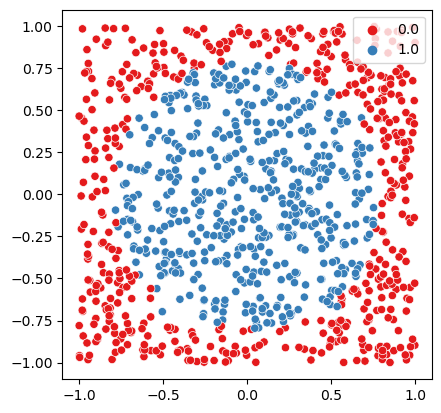

In [26]:
np.random.seed(2023)
F = np.random.uniform(size=y.shape)
print(((F > 0.5) == y).mean())
plot_data(X, np.round(F > 0.5))
plt.show()

for t in range(10000):
    r = (-1.)*log_loss_gradient_p(y,F)
    tree = DecisionTreeRegressor(max_depth=1)
    tree.fit(X, r)
    f_t = tree.predict(X)
    
    #now find alpha_t
    log_loss_vals = np.asarray([ log_loss(y, F+ alpha * f_t).mean() for alpha in alpha_space])
    alpha_t = alpha_space[ np.argmin(log_loss_vals)]
    
    #add to the ensemble
    F = F + alpha_t * f_t #zamien na argmin
    print(t, "\t", ((F > 0.5) == y).mean(), "\t",  log_loss(y,F).mean(), "\t", alpha_t)
    

plot_data(X, np.round(F > 0.5))
plt.show()


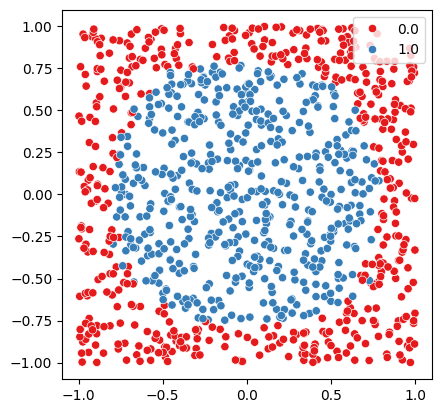

In [27]:
plot_data(X, np.round(F > 0.5))
plt.show()

In [28]:
np.round(F)

array([  117.,    67.,   -30.,    18.,  -143.,   -25.,    97.,   -26.,
         117.,   103.,   101.,    94.,   114.,    -4.,   104.,   -49.,
          -4.,   115.,   -88.,   -31., -1230.,   -17.,    35.,  -128.,
         117.,   107.,    -0.,   105.,   115.,    10.,   116.,   103.,
         -30.,   -29.,   107.,   118.,    -4.,    17., -1333.,   100.,
         -21., -1233.,    92.,   -26.,   -25.,   107.,    -9.,    -8.,
         101., -1233.,   105.,   108.,   100.,   117.,    99.,    90.,
        -334.,    39.,   -98.,     5.,   114., -1221.,    96.,   103.,
          89.,   -16.,    -8.,   -16.,   103.,    94.,    71.,   -14.,
          94.,     1.,   115.,  -149.,   -15.,   103.,   -28.,     5.,
        -358., -1249.,   113.,    -7.,   104.,   108.,  -115.,    36.,
        -195.,   -20.,   109.,   -11.,  -129.,    91.,     0.,   112.,
        -148.,   106.,    -1., -1334.,    -8.,   -30.,   104.,    12.,
       -1229.,   117.,    -6.,   -58., -1221.,   104., -1222.,    -1.,
      

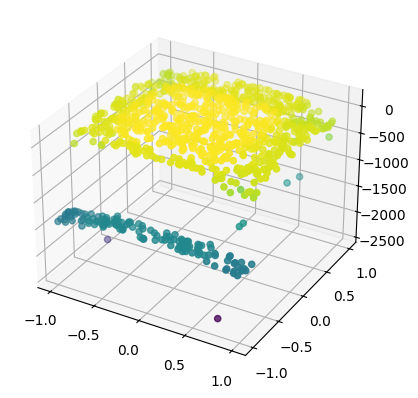

In [29]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt

fig = plt.figure()
ax = plt.axes(projection='3d')



# Data for three-dimensional scattered points

ax.scatter3D(X[:,0], X[:,1], F, c=F, cmap='viridis');

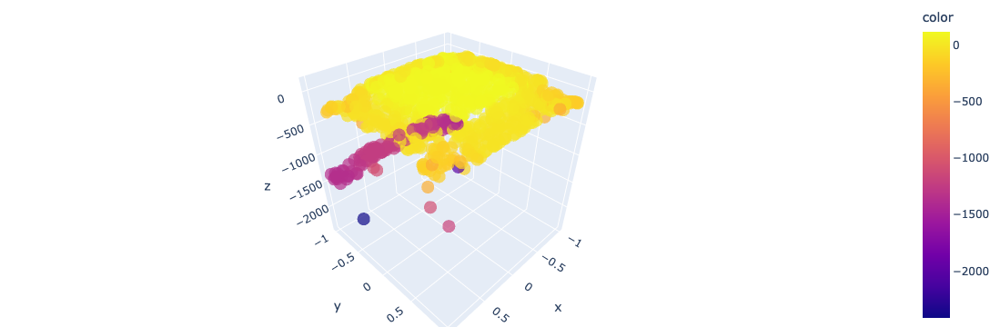

In [30]:
import plotly.express as px
df = px.data.iris()
fig = px.scatter_3d(x=X[:,0], y=X[:,1], z=F,
              color=F, size_max=18,
              opacity=0.7)

# tight layout
fig.update_layout(margin=dict(l=0, r=0, b=0, t=0))

## XGBoost

Gradient boosting introduced in the last section extended boosting to a variety of loss functions, but it still kept low requirements on the weak regressor: it was only required to be able to fit the gradient of the loss on training samples using a MSE criterion.

XGBoost is specialized to boosting decision trees. It allows optimizing different loss functions by directly growing trees that optimize them. It combines the following ideas:
- Loss functions are approximated using a Taylor expansion, thus to XGBoost they all look like quadratics.
- Regularization terms are added to the loss to promote small trees with smooth values in the leaves.
- Trees are greedily created, to minimize the training objective - the optimized loss is used directly in place of a purity or simple MSE critetion for split selection!

The XGBoost model assumes the following loss optimization objective:

$$
\mathcal{L} = \sum_i L\left(y^i, \sum_t f_t(x^i)\right) + \sum_t\Omega(f_t),
$$
where:
- $L$ is a loss function, e.g. cross-entropy or MSE
- $f_t$ is the tree learned during round $t$
- $\Omega$ is a tree penalty, $\Omega(f) = \gamma |f| + \lambda \frac{1}{2} \sum_{1}^{|f|}(\omega_j)^2$ with $|f|$ denoting the number of leaves in the tree $f$ and $\omega_j$ is the value returned by leaf $j$.

Thus XGBoost aims to create an ensemble of trees which minimize a given loss function, are small and have small $L_2$ norm of their values.

During round $t$ XGBoost greedily grows a tree to directly minimize the objective.

First, it replaces the loss $L$ for each data sample with a Taylor aproximation. After removing constant terms the objective during round $t$ becomes:

$$
\mathcal{\tilde{L}_t} = \sum_i\left[g_i f_t(x^i) + \frac{1}{2}h_if_t^2(x^i) \right] + \Omega(f_t),
$$
where $g_i, h_i$ are they Taylor expansion coefficients given by: $g_i = \left[\frac{\partial L(y^i, F(x^i))}{\partial{F(x^i)}}\right]_{F = F_{t-1}}$ and $h_i = \left[\frac{\partial^2 L(y^i, F(x^i))}{\partial(F(x^i))^2}\right]_{F = F_{t-1}}$.

Suppose that the tree added in round $t$ has $M$ leaves denoted $R_{t1},...,R_{tM}$. We can rewrite the loss as:
$$
\begin{split}
\mathcal{\tilde{L}_t} &= \sum_i\left[g_i f_t(x^i) + \frac{1}{2}h_if_t^2(x^i) \right] + \gamma M +\lambda\frac{1}{2}\sum_{j=1}^M \omega_j^2 \\
&= \sum_{j=1}^M\left[\left(\sum_{i\in R_{tj}}g_i\right)\omega_j + \frac{1}{2}\left(  \sum_{i\in R_{tj}}h_i + \lambda\right)\omega_j^2 \right] + \gamma M
\end{split}
$$

For each leaf, we can find its optimal value:
$$
\omega_j^* = -\frac{\sum_{i\in R_{tj}} g_i}{\sum_{i\in R_{tj}}(h_i + \lambda)}
$$

Plugging this optimal value into the loss gives us a score of the tree structure:
$$
\mathcal{\tilde{L}_t} -\frac{1}{2}\sum_{j=1}^M\frac{\left(\sum_{i\in R_{tj}} g_i\right)^2}{\sum_{i\in R_{tj}}(h_i + \lambda)} + \gamma M
$$

We can then perform a greedy search for tree splits, by using the above score as a split node quality.

XGBoost implements many further optimizations that enhance the quality of the ensembles:
1. Shrinkage: newly added weights are multipied by $\alpha<1$, which we can interpret as making smaller gradient steps.
2. Randomized tree building:
    * row subsampling: trees are built on subsets of training data
    * column subsampling: similarly to random forests, trees consider only a random subset of attributes
3. Distributed computations and collection of approximate leaf statistics, using sketching techniques. If you are interested, you should consider [dr Uznański's course](https://zapisy.ii.uni.wroc.pl/offer/723-algorithms-for-big-data/).

# Other Uses of Boosting

Boosting fits an ensemble of classifiers by sequentially learning models which correct mistakes of previous ones. Intuitively, models learned early on take care of the "broad picture", the general fit to the data, while the models learned at the later rounds "fill in the details". This intuition is used in cascaded object detectors.

The [Viola-Jones](https://en.wikipedia.org/wiki/Viola%E2%80%93Jones_object_detection_framework) face recognizer was one of the first that could be run in real time on digital cameras. Its task was to detect faces in an image. This task can be reduced to scoring each possible face location (rectangle in the image, given e.g. by the upper left and lower right corners). Since there are many possible locations to score, the classifier was designed to very quickly give up on non-prospective regions.

This was obtained using a cascaded architecture:
- the first classifier was made to reject the majority of regions, having a very low probability of rejecting a face
- the next classifier was slightly more precise, hence slower, but it was run much less often, it again had to reject maximally many non-faces, while keeping the face rejection probability very low.
- subsequent classifiers were again allowed to be larger, but due to the rejection of non-faces by previous stages they were run very infrequently.

Fast rejection of non-faces means that the classifiers must be extremely basic, and cheap to execute. In other words, they are weak learners. The Viola-Jones detector uses simple wavelet features, which compare the amount of ink in the white and dark regions:


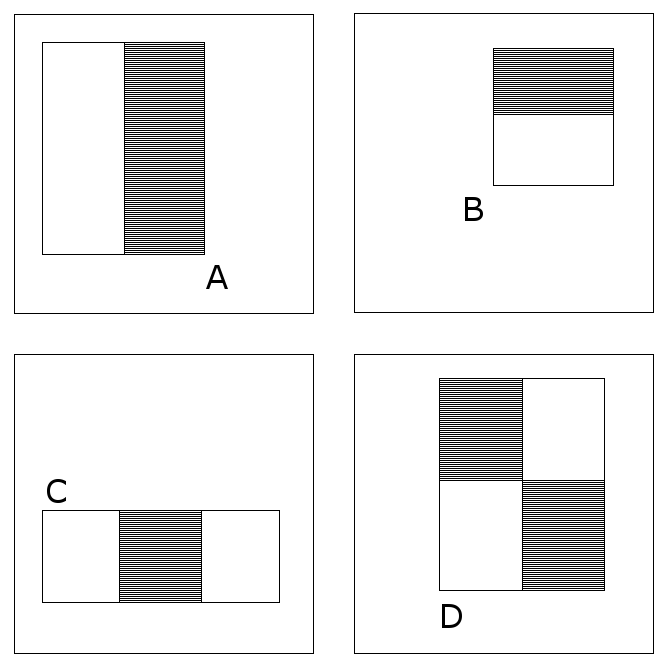

These features can be computed in constant time given an integral image (image containing cumulative sums over pixel values). Moreover, they do not require floating point arithmetics.

Early stages of the cascade used only a few features, nevertheless they were able to reject many non-faces, allowing larger tree-based classifiers where the features were used for splits.

We show below features used by first few stages, they intuitively react to the eye region and the nose:

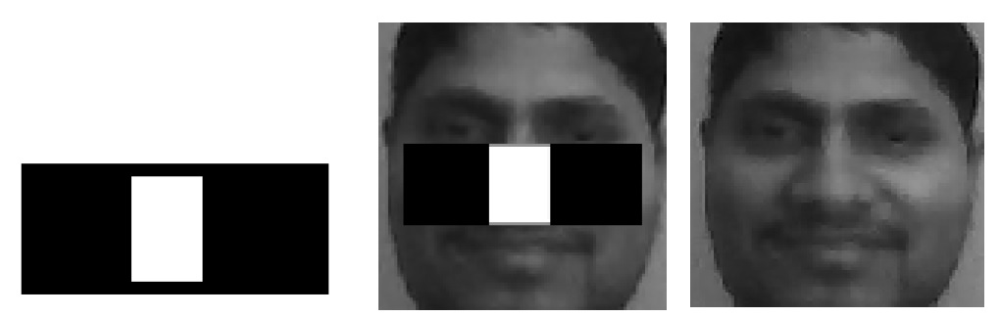
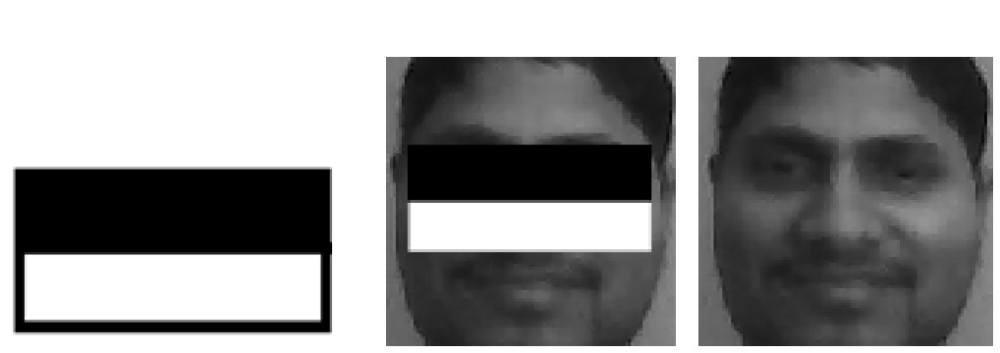

The Viola-Jones detector was trained using AdaBoost modified to support assymetrical errors: rejecting a face image was penalised more severely than keeping a non-face image.


# Conclusions

In this set of notes we have seen how ensembles may be built sequentially by adding classifiers that are forced to correct the operation of the ensemble. 

Boosted classifiers optimize a loss function on the data, by sequentially expanding an ensemble with additional classifiers. This approach can be interpreted as a greedy selection of data transformations

Boosted Decision Trees are very strong, broadly applicable models. Popular implementations of boosting such as XGBoost or the newer CatBoost or LightGBM has been used in winning solutions of many Kaggle contests. 

# Further reading
- Murphy, chapter 16.4
- [Elements of Statistical Learning](https://web.stanford.edu/~hastie/ElemStatLearn/), chapter 10
- [XGBoost paper]()
- XGBoost [intro](https://xgboost.readthedocs.io/en/latest/tutorials/model.html), [presentation](https://web.archive.org/web/20200415044009/https://homes.cs.washington.edu/~tqchen/pdf/BoostedTree.pdf), and [paper](https://www.kdd.org/kdd2016/papers/files/rfp0697-chenAemb.pdf).